In [2]:
import torch
from master_thesis.src import utils, models, data

from transformers import BertTokenizer, BertTokenizerFast
from torch.utils.data import DataLoader

import pandas as pd
pd.set_option('display.max_rows', 200)

import numpy as np
import json


import scipy.stats as st
from sklearn.metrics import mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
#%matplotlib inline

## Loading a model (and later a corresponding checkpoint for making predictions)

In [3]:
model = models.BertFFN(n_outputs=1)
#identifier = 'BertFFN_FIXLEN128_MINLENNone_START0_EP40_BS32_LR1e-05_avgTimeOnPage_NOZ_2021-02-13_11:04:55'
identifier = 'BertFFN_FIXLEN512_MINLENNone_START0_EP30_BS32_LR1e-05_avgTimeOnPage_NOZ_2021-03-03_00:13:33'
#identifier = 'BertFFN_FIXLEN512_MINLENNone_START0_EP30_BS32_LR1e-05_log_avgTimeOnPage_NOZ_2021-04-24_10:19:20'

#model = models.BertTextlength(n_outputs = 1)
#identifier = 'BertTextlength_FIXLEN128_MINLENNone_START0_EP40_BS32_LR1e-05_avgTimeOnPage_NOZ_1Layer_2021-02-14_20:44:37'
#identifier = 'BertTextlength_FIXLEN128_MINLENNone_START0_EP40_BS32_LR1e-05_avgTimeOnPage_NOZ_2Layer_2021-02-17_16:58:15'
#identifier = 'BertTextlength_FIXLEN512_MINLENNone_START0_EP40_BS32_LR1e-05_avgTimeOnPage_NOZ_2021-03-01_17:14:32'


#model = models.BertHierarchical(n_outputs = 1, max_sect= 8)
#identifier = 'BertHierarchical_SECTIONSIZE128_MAX_SECT8_EP100_BS32_LR1e-05_avgTimeOnPage_NOZ_2021-02-15_10:21:40'
#identifier = 'BertHierarchical_SECTIONSIZE128_MAX_SECT8_EP100_BS32_LR1e-05_avgTimeOnPage_NOZ_weighted_mean_2021-04-05_18:09:05'



In [4]:
#for name, param in model.named_parameters():
#    print(name)
#    print("\t", param.size())

#for key in model.state_dict().keys():
#    print(key)
#    params = model.state_dict()[key]
#    print(params.size())
#    #print(params[0])
    


## Loading one checkpoint

In [5]:
PATH = utils.OUTPUT / 'saved_models' / f'{identifier}'
model_state_dict = torch.load(PATH, map_location=torch.device('cpu'))["model_state_dict"]
model.load_state_dict(model_state_dict)

<All keys matched successfully>

In [6]:
#model.state_dict().keys() #["weight_vector"]
#model_state_dict.keys()

In [7]:
PRE_TRAINED_MODEL_NAME = 'bert-base-german-cased'

In [8]:
#tokenizer = BertTokenizer.from_pretrained(PRE_TRAINED_MODEL_NAME)
tokenizer = BertTokenizerFast.from_pretrained(PRE_TRAINED_MODEL_NAME) # warum auch immer, aber das hier braucht shap unten, scheint aber das gleiche zu tun...



In [9]:
NOZ = utils.get_publisher_df("NOZ")

Shape of df: (36383, 32)


In [10]:
NOZ.head()

,pageviews,exits,entrances,bounces,timeOnPage,category,rubric,title,date,titel,...,avgTimeOnPagePerWordcount,avgTimeOnPage_percentile,pageviews_percentile,avgTimeOnPagePerWordcount_percentile,language,nr_tokens_text_punct,nr_tokens_text_BERT,log_avgTimeOnPage,publisher,nr_tokens_publisher
articleId,,,,,,,,,,,,,,,,,,,,,
NOZ_1210,271,212,227,88,30108.0,lokales,papenburg,08-ems-wand-aus-zeitungen,NaN,8000 Quadratmeter voller Ideen: Mauer aus 3000...,...,0.983247,97.772930,36.193301,91.462140,de,579,685,6.235009,NOZ,519
NOZ_1248,445,353,356,113,50741.0,lokales,meppen,09-ems-friedhofswald,NaN,Letzte Ruhe unter Bäumen: Stiller Boom im Mepp...,...,0.577521,98.081993,53.417871,73.041087,de,1070,1276,6.312701,NOZ,955
NOZ_2250,1065,961,980,299,105796.0,lokales,osnabrueck,osnabruck-ultraschall-attacke-auf-kinder,NaN,Kreischmaschine sichergestellt: Osnabrück: Ult...,...,1.839547,99.543223,73.921689,98.652395,de,619,809,6.924877,NOZ,553
NOZ_2630,270,215,209,92,16777.0,lokales,bramsche,saisonfinale-auf-dem-erdbeerfeld-in-hesepe,NaN,Ende der Woche ist Schluss: Saisonfinale auf d...,...,0.533280,92.664303,36.041042,68.818744,de,653,819,5.720431,NOZ,572
NOZ_2750,1046,885,846,415,82803.0,lokales,osnabrueck,knigge-ratgeber-fur-den-sommer,NaN,"Rasenmähen, Grillen, Planschen: Knigge-Ratgebe...",...,0.388741,97.820653,73.595582,47.938824,de,1475,1877,6.242815,NOZ,1323


In [10]:
NOZ[NOZ.avgTimeOnPage >= 250].head(10)

,pageviews,exits,entrances,bounces,timeOnPage,category,rubric,title,date,titel,...,nr_tokens_text,avgTimeOnPagePerWordcount,avgTimeOnPage_percentile,pageviews_percentile,avgTimeOnPagePerWordcount_percentile,language,nr_tokens_text_punct,nr_tokens_text_BERT,publisher,nr_tokens_publisher
articleId,,,,,,,,,,,,,,,,,,,,,
NOZ_1210,271,212,227,88,30108.0,lokales,papenburg,08-ems-wand-aus-zeitungen,NaN,8000 Quadratmeter voller Ideen: Mauer aus 3000...,...,519,0.983247,97.772930,36.193301,91.462140,de,579,685,NOZ,519
NOZ_1248,445,353,356,113,50741.0,lokales,meppen,09-ems-friedhofswald,NaN,Letzte Ruhe unter Bäumen: Stiller Boom im Mepp...,...,955,0.577521,98.081993,53.417871,73.041087,de,1070,1276,NOZ,955
NOZ_2250,1065,961,980,299,105796.0,lokales,osnabrueck,osnabruck-ultraschall-attacke-auf-kinder,NaN,Kreischmaschine sichergestellt: Osnabrück: Ult...,...,553,1.839547,99.543223,73.921689,98.652395,de,619,809,NOZ,553
NOZ_2630,270,215,209,92,16777.0,lokales,bramsche,saisonfinale-auf-dem-erdbeerfeld-in-hesepe,NaN,Ende der Woche ist Schluss: Saisonfinale auf d...,...,572,0.533280,92.664303,36.041042,68.818744,de,653,819,NOZ,572
NOZ_2750,1046,885,846,415,82803.0,lokales,osnabrueck,knigge-ratgeber-fur-den-sommer,NaN,"Rasenmähen, Grillen, Planschen: Knigge-Ratgebe...",...,1323,0.388741,97.820653,73.595582,47.938824,de,1475,1877,NOZ,1323
NOZ_4542,1201,1123,1124,392,112905.0,deutschland-und-welt,gut-zu-wissen,mucken-mogen-schweiss-schwangere-und-bier,NaN,"Wer wird gestochen?: Mücken mögen Schweiß, Sch...",...,582,2.487113,99.856831,76.137397,99.386419,de,653,865,NOZ,582
NOZ_5154,767,638,656,208,64563.0,lokales,melle-nord,geheimtipp-ludwigsee,NaN,Ludwigsee: mehr als Badespaß: Geheimtipp Ludwi...,...,480,1.042684,97.695664,67.235933,92.723389,de,544,686,NOZ,480
NOZ_5420,167,113,101,30,25208.0,lokales,bramscher-ortsteile,lebendige-erinnerungen-ans-heseper-nato-camp,NaN,Vor 25 Jahren geschlossen: Lebendige Erinnerun...,...,1206,0.387077,97.347968,18.119944,47.559313,de,1351,1659,NOZ,1206
NOZ_6055,7394,6567,6797,2906,309471.0,lokales,osnabrueck,betreten-verboten-bade-nicht-bei-den-uhu-kindern,NaN,Lengericher „Canyon“: Betreten verboten: Bade ...,...,322,1.162140,95.784474,96.743478,94.655031,de,353,447,NOZ,322


In [11]:
ID = "NOZ_4542" #"NOZ_2630"
text = NOZ.loc[ID, "article_text"]
print(NOZ.loc[ID, "nr_tokens_text"])
print(NOZ.loc[ID, "nr_tokens_text_BERT"])
print(NOZ.loc[ID, "avgTimeOnPage"])
print("---")
print(text)

582
865
1447.5
---
Wer wird gestochen?: Mücken mögen Schweiß, Schwangere und Bier Mücken mögen nicht jeden. Während manche Menschen Nacht für Nacht regelrecht zerstochen werden, können andere praktisch unbehelligt durchschlafen. Warum ist das so? Eine Frage, die auch die Wissenschaft interessiert. Osnabrück. Der Entomologe Jonathan Day sagt: „Unsere Studien zeigen, dass etwa 20 Prozent der Menschen für die Mücken besonders attraktiv sind.“ Das hat gleich mehrere Gründe, meint der Insektenkundler von der Universität von Florida in Vero Beach. „Zuerst einmal orientieren sich Mücken auf visuellem Wege, vor allem auch in der Dämmerung. Hier zeigt sich, dass Menschen mit dunkler Kleidung vorrangig angeflogen werden, und auch jene, die durch Bewegungen auf sich aufmerksam machen.“ Der größte Trumpf der kleinen Biester ist aber wohl, dass sie uns so gut riechen können, denn Körperausdünstungen nehmen Mücken bis auf eine Entfernung von 50 Metern wahr, haben die Forscher herausgefunden. Ihr gut

In [128]:
encoding = tokenizer.encode_plus(text,
                                      max_length=None,
                                      truncation=False,
                                      return_token_type_ids=False,
                                      pad_to_max_length=False,
                                      return_attention_mask=True,
                                      return_tensors='pt',
                                      )

In [129]:
input_ids = encoding['input_ids'][0]

In [130]:
len(input_ids)

867

In [131]:
input_ids[-19:]

tensor([26918,  5506,  3877,   458,    30,  8431, 26914,  5615,  3171, 26918,
           93,  1583,  3278,  2294,   194,   357, 24308, 26914,     4])

In [132]:
tokenizer.convert_ids_to_tokens(input_ids)[:20]

['[CLS]',
 'Wer',
 'wird',
 'gest',
 '##ochen',
 '?',
 ':',
 'Mü',
 '##cken',
 'mögen',
 'Schwei',
 '##ß',
 ',',
 'Schwanger',
 '##e',
 'und',
 'Bier',
 'Mü',
 '##cken',
 'mögen']

In [133]:
tokens = tokenizer.tokenize(text)
#tokens = tokenizer.tokenize(NOZ.loc["NOZ_2630", "article_text"])

In [134]:
len(tokens)

865

In [135]:
" / ".join(tokens[:512])

'Wer / wird / gest / ##ochen / ? / : / Mü / ##cken / mögen / Schwei / ##ß / , / Schwanger / ##e / und / Bier / Mü / ##cken / mögen / nicht / jeden / . / Während / manche / Menschen / Nacht / für / Nacht / regel / ##recht / zerst / ##ochen / werden / , / können / andere / praktisch / unbe / ##hell / ##igt / durchs / ##ch / ##lafen / . / Warum / ist / das / so / ? / Eine / Frage / , / die / auch / die / Wissenschaft / interessiert / . / Osnabrück / . / Der / Ent / ##omo / ##log / ##e / Jonathan / Day / sagt / : / [UNK] / Unsere / Studien / zeigen / , / dass / etwa / 20 / Prozent / der / Menschen / für / die / Mü / ##cken / besonders / attraktiv / sind / . / [UNK] / Das / hat / gleich / mehrere / Gründe / , / meint / der / Insekten / ##kund / ##ler / von / der / Universität / von / Florida / in / Ver / ##o / Beach / . / [UNK] / Zuerst / einmal / orientieren / sich / Mü / ##cken / auf / vis / ##uelle / ##m / Wege / , / vor / allem / auch / in / der / Däm / ##mer / ##ung / . / Hier / zeigt 

In [136]:
encoding = tokenizer.encode_plus(text,
                                      max_length=128,
                                      truncation=False,
                                      return_token_type_ids=False,
                                      pad_to_max_length=True,
                                      return_attention_mask=True,
                                      return_tensors='pt',
                                      )

In [137]:
input_ids = encoding["input_ids"]
attention_mask = encoding["attention_mask"]

In [138]:
input_ids

tensor([[    3,  1309,   292,  1306,  4671, 26972, 26964,  2932,   903, 17888,
          1948, 26949, 26918, 14994, 26897,    42,  7035,  2932,   903, 17888,
           149,  2204, 26914,  1939,  9768,  1075,  3518,   142,  3518,  2514,
           652,  4158,  4671,   266, 26918,   718,  1355, 10236,  1858, 18954,
           733, 22118,     8, 14382, 26914,  8357,   127,    93,   181, 26972,
           917,  1685, 26918,    30,   194,    30,  3497, 11645, 26914, 15412,
         26914,   233,   442, 21988, 21963, 26897, 23943, 15080,  1462, 26964,
             2, 17056,  3419,  3968, 26918,   221,   761,   148,  1028,    21,
          1075,   142,    30,  2932,   903,  2406, 21515,   287, 26914,     2,
           295,   193,   911,  2071,  4236, 26918,  6948,    21, 14742,  4119,
           450,    88,    21,  1594,    88, 14100,    50,   133, 26910, 14981,
         26914,     2, 21851,  1757, 19994,   144,  2932,   903,   115, 19397,
          3701, 26911,  4976, 26918,   200,  1208,  

In [139]:
tokenizer.convert_ids_to_tokens(input_ids[0])

['[CLS]',
 'Wer',
 'wird',
 'gest',
 '##ochen',
 '?',
 ':',
 'Mü',
 '##cken',
 'mögen',
 'Schwei',
 '##ß',
 ',',
 'Schwanger',
 '##e',
 'und',
 'Bier',
 'Mü',
 '##cken',
 'mögen',
 'nicht',
 'jeden',
 '.',
 'Während',
 'manche',
 'Menschen',
 'Nacht',
 'für',
 'Nacht',
 'regel',
 '##recht',
 'zerst',
 '##ochen',
 'werden',
 ',',
 'können',
 'andere',
 'praktisch',
 'unbe',
 '##hell',
 '##igt',
 'durchs',
 '##ch',
 '##lafen',
 '.',
 'Warum',
 'ist',
 'das',
 'so',
 '?',
 'Eine',
 'Frage',
 ',',
 'die',
 'auch',
 'die',
 'Wissenschaft',
 'interessiert',
 '.',
 'Osnabrück',
 '.',
 'Der',
 'Ent',
 '##omo',
 '##log',
 '##e',
 'Jonathan',
 'Day',
 'sagt',
 ':',
 '[UNK]',
 'Unsere',
 'Studien',
 'zeigen',
 ',',
 'dass',
 'etwa',
 '20',
 'Prozent',
 'der',
 'Menschen',
 'für',
 'die',
 'Mü',
 '##cken',
 'besonders',
 'attraktiv',
 'sind',
 '.',
 '[UNK]',
 'Das',
 'hat',
 'gleich',
 'mehrere',
 'Gründe',
 ',',
 'meint',
 'der',
 'Insekten',
 '##kund',
 '##ler',
 'von',
 'der',
 'Universität',
 

In [140]:
input_ids.shape

torch.Size([1, 128])

In [141]:
model.eval()
model(input_ids = input_ids, attention_mask = attention_mask)

# Gut, true ist 305.04 (siehe oben)

TypeError: forward() missing 1 required positional argument: 'textlength'

In [9]:
START = 0
FIXED_LEN = 512 #128 #512 # 128
MIN_LEN = None
PUBLISHER = "NOZ"
FRACTION = 1
TARGET = "log_avgTimeOnPage"# "avgTimeOnPage"


In [10]:
# für BertFFN und BertTextlength:
BATCH_SIZE = 32
transform = data.TransformBERT(tokenizer = tokenizer, start = START, fixed_len = FIXED_LEN, min_len= MIN_LEN)
collater = data.CollaterBERT()

# für BertHierarchical:
#SECTION_SIZE = 128
#MAX_SECT = 8
#BATCH_SIZE = 8
#transform = data.TransformBERT(tokenizer = tokenizer, keep_all = True, start = None, fixed_len = None, min_len= None)
#collater = data.CollaterBERT_hierarchical(max_sect=MAX_SECT, section_size=SECTION_SIZE)


ds_dev = data.PublisherDataset(publisher=PUBLISHER, set = "dev", fraction=FRACTION, target = TARGET, text_base = "article_text", transform = transform)
dl_dev = DataLoader(ds_dev, batch_size=BATCH_SIZE, num_workers=0, shuffle=False, collate_fn=collater, drop_last=False)


Shape of df: (36383, 32)
Length of Dataset dev 3638


In [11]:
d = next(iter(dl_dev))
print(d.keys())
#input_ids = d['input_ids']
#print(input_ids)
#print(input_ids.shape)
#attention_mask = d['attention_mask']
#print(attention_mask)
#print(attention_mask.shape)
print(d['target'])
print(d['articleId'])

dict_keys(['input_ids', 'attention_mask', 'target', 'textlength', 'BERT_tokens', 'publisher', 'articleId'])
tensor([[5.3085],
        [5.0156],
        [4.9260],
        [4.7735],
        [5.2745],
        [5.4078],
        [4.9050],
        [5.1811],
        [5.4536],
        [5.0612],
        [5.1031],
        [4.1320],
        [5.3322],
        [5.0603],
        [4.5173],
        [5.0992],
        [5.6425],
        [5.2258],
        [5.1892],
        [5.2879],
        [5.1235],
        [4.8454],
        [4.9741],
        [5.5658],
        [5.4462],
        [4.9822],
        [5.1777],
        [5.1199],
        [5.1780],
        [4.9278],
        [4.8194],
        [6.6588]])
['NOZ_2014740', 'NOZ_1995583', 'NOZ_2122594', 'NOZ_2016469', 'NOZ_2004936', 'NOZ_2019084', 'NOZ_2010579', 'NOZ_2027589', 'NOZ_2004559', 'NOZ_1956771', 'NOZ_1727067', 'NOZ_1966648', 'NOZ_1594080', 'NOZ_2050789', 'NOZ_1971298', 'NOZ_1963812', 'NOZ_611769', 'NOZ_2082312', 'NOZ_1948501', 'NOZ_2075805', 'NOZ_1935111', 

In [12]:
len(dl_dev) # 114 batches

114

In [13]:
with open(utils.OUTPUT / "splits" / f"{PUBLISHER}_splits.json", "r") as f:
    splits = json.load(f)
    dev_IDs = splits["dev"]

In [35]:
dev_preds = pd.DataFrame(0., index = dev_IDs, columns = ["true", "pred", "avgTimeOnPage"])

In [36]:
dev_preds.head()

,true,pred,avgTimeOnPage
NOZ_2093706,0.0,0.0,0.0
NOZ_1990893,0.0,0.0,0.0
NOZ_2053403,0.0,0.0,0.0
NOZ_2093781,0.0,0.0,0.0
NOZ_2133782,0.0,0.0,0.0


In [37]:
using = "cpu"

if using == "cpu":
    device = torch.device('cpu')
if using == "gpu":
    device = torch.device('cuda')
    
print(device)

cpu


In [47]:
model.to(device)

model.eval()

with torch.no_grad():
    for nr, d in enumerate(dl_dev):
        print(nr, end='\r')
        articleIds = d["articleId"]
        
        # für Bert und BertTextlength
        input_ids = d["input_ids"].to(device)
        attention_mask = d["attention_mask"].to(device)
        
        ## für BertHierarchical
        #section_input_ids = d["section_input_ids"].to(device)
        #section_attention_mask = d["section_attention_mask"].to(device)
        
        #textlength = d["BERT_tokens"].to(device)
        
        targets = d["target"].detach().numpy()
        
        outputs = model(input_ids=input_ids, attention_mask=attention_mask).cpu()#.detach().numpy()
        
        #outputs = model(input_ids=input_ids, attention_mask=attention_mask, textlength = textlength).detach().numpy()
        
        #outputs = model(section_input_ids = section_input_ids,
        #                section_attention_mask = section_attention_mask)
                        #textlength=textlength).detach().numpy()

      
        for ID, pred, true in zip(articleIds, outputs, targets):
            #print(ID, pred.item(), true.item())
            dev_preds.loc[ID, "pred"] = pred.item()
            dev_preds.loc[ID, "true"] = true.item()

        #if nr > 3:
        #    break
            
# TODO: Das hier sollte für BertHierarchical wohl doch auf der GPU laufen

In [48]:
# das hier ist nur nötig, wenn target == log_avgTimeOnPage war, damit man die richtig skalierten Werte bekommt

for ID in dev_preds.index:
    dev_preds.loc[ID, "avgTimeOnPage"] = NOZ.loc[ID, "avgTimeOnPage"]

dev_preds["exp_pred"] = np.exp(dev_preds.pred)

In [49]:
dev_preds.loc["NOZ_2014740"]

true               5.308548
pred               5.276382
avgTimeOnPage    202.056604
exp_pred         195.660687
Name: NOZ_2014740, dtype: float64

In [50]:
print(NOZ.loc["NOZ_2014740"].avgTimeOnPage) # just to check
print(NOZ.loc["NOZ_2014740"].log_avgTimeOnPage) # just to check

202.0566037735849
5.308547874848753


In [51]:
dev_preds.head(10)

,true,pred,avgTimeOnPage,exp_pred
NOZ_2093706,5.335989,5.262950,207.678161,193.050231
NOZ_1990893,5.093498,5.243881,162.958904,189.403797
NOZ_2053403,5.303853,5.348172,201.110236,210.223597
NOZ_2093781,4.611494,4.793257,100.634328,120.693800
NOZ_2133782,4.899199,4.972487,134.182292,144.385524
NOZ_2039028,5.503170,5.349282,245.468750,210.457091
NOZ_2008155,4.544044,4.963095,94.070423,143.035766
NOZ_1988194,4.492141,4.974827,89.312500,144.723759
NOZ_2060578,5.194507,5.298714,180.279167,200.079375
NOZ_2040020,5.797541,5.345847,329.488235,209.735483


In [30]:
#dev_preds.to_csv(utils.OUTPUT / "predictions_dev" / f'{identifier}.tsv', sep ="\t", 
#                 index=True,
#                 index_label="articleId")

In [72]:
dev_preds = pd.read_csv(utils.OUTPUT / "predictions_dev" / f'{identifier}.tsv', sep ="\t", 
                       index_col = "articleId")

In [73]:
def scatter(true, pred):
    print(len(true), true[:5])
    print(len(pred), pred[:5])
    plt.scatter(true, pred, alpha = 0.1)
    plt.xlabel('True')
    plt.ylabel('Predictions')
    plt.axis('equal')
    plt.axis('square')
    plt.xlim(0,1000)
    plt.ylim(0,1000)
    plt.show()
    
    print("Pearson:", st.pearsonr(true, pred))
    print("MAE:", mean_absolute_error(true, pred))
    print("MSE:", mean_squared_error(true, pred))
    print("RAE:", utils.relative_absolute_error(pred, true))

In [74]:
np.mean(dev_preds.pred)

175.76932550433443

3638 articleId
NOZ_2093706    207.678162
NOZ_1990893    162.958908
NOZ_2053403    201.110229
NOZ_2093781    100.634331
NOZ_2133782    134.182297
Name: true, dtype: float64
3638 articleId
NOZ_2093706    195.700546
NOZ_1990893    135.614120
NOZ_2053403    199.548523
NOZ_2093781     95.580338
NOZ_2133782    112.190811
Name: pred, dtype: float64


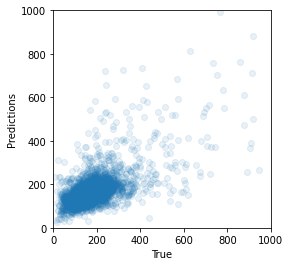

Pearson: (0.6946474244346293, 0.0)
MAE: 54.653929131577605
MSE: 10395.387799069851
RAE: 76.68431745964352


In [76]:
scatter(true = dev_preds.true, pred = dev_preds.pred)
#scatter(true = dev_preds.avgTimeOnPage, pred = dev_preds.exp_pred)

In [35]:
# append text (just for inspecting)
for id_nr, ID in enumerate(dev_preds.index):
    dev_preds.loc[ID, "article_text"] = NOZ.loc[ID, "article_text"]
    dev_preds.loc[ID, "nr"] = int(id_nr)
    dev_preds.loc[ID, "textlength"] = NOZ.loc[ID, "nr_tokens_text_BERT"]

In [36]:
dev_preds.head()

,true,pred,article_text,nr,textlength
articleId,,,,,
NOZ_2093706,207.678162,195.700546,"Initiative ""Grün statt Grau"" übt Kritik: Das g...",0.0,987.0
NOZ_1990893,162.958908,135.614120,Heiger Scholz zu Besuch im JHD: Staatssekretär...,1.0,806.0
NOZ_2053403,201.110229,199.548523,Pfarreiengemeinschaft gibt sich neue Regeln: S...,2.0,705.0
NOZ_2093781,100.634331,95.580338,Erneuter Fall in Tokio: Drei Monate altes Baby...,3.0,330.0
NOZ_2133782,134.182297,112.190811,Leichte Schnittverletzung: Radfahrer sticht Fr...,4.0,405.0


In [37]:
np.mean(dev_preds.pred[:1000])

178.60203937721252

In [38]:
# show articles with highest predictions
dev_preds.sort_values(by="pred", ascending=False).head(20)

,true,pred,article_text,nr,textlength
articleId,,,,,
NOZ_1376771,763.160278,1249.370483,Schauspieler und vierfacher Vater: Wolfram Koc...,2914.0,3400.0
NOZ_515048,2396.707520,1242.196899,Gitarrist und Sänger im Interview: Farin Urlau...,302.0,2916.0
NOZ_407676,1198.602417,1153.189941,„Vaters Traum verwirklicht“ Mit dem Ende der F...,1370.0,3052.0
NOZ_959321,287.945007,1052.957886,"Warum ich glücklich bin, kein Vegetarier mehr ...",1602.0,1245.0
NOZ_700753,768.426941,993.688293,Moderatoren über ihre Sendung: „Kika live“: Be...,2237.0,857.0
NOZ_420600,919.519226,879.928223,Komplizierte Rechtslage: Pfleger können von Pa...,830.0,802.0
NOZ_729041,1636.495605,876.270447,Schutz vor Überhitzung: Ständig schweißgebadet...,389.0,1416.0
NOZ_822659,1057.390015,873.032776,Angebote bei Ebay: Darf ich ein Känguru halten...,1589.0,753.0
NOZ_712712,1383.452271,864.747437,Mao Tsetung: „Ich habe meine Mutter getötet“ –...,2820.0,1396.0


# SHAP

In [39]:
# importing SHAP
import shap
shap.initjs()


# Erkenntnisse:

* man braucht eine Funktion, die Texte in einer Liste nimmt und dann direkt einen Model-Output ausspuckt
* --> sieh model_predict(x)
* der tokenizer ist wichtig, denn so erkennt Shap, was für eine Art Features er sich überhaupt anschaut und er dient Shap wohl als "Masker" (denn er lässt immer Tokens weg um deren Wichtigkeit zu bestimmen)
* warum auch immer, aber das klappt nur mit BertTokenizerFast (nicht mein bisheriger BertTokenizer, aber ich merke bisher keinen Unterschiedn, hat irgendwas mit einem "mapping" zu tun)
* man kann dann ein shap.Explainer()-Objekt erstellen, der bekommt die Funktion und den Tokenizer
* ugünstig ist: wenn der gesamte Text in das Explainer-Objekt reingeschoben wird, dann betrachtet zwar das MODEL nur die ersten 128 (oder was) Tokens, aber der Explainer permutiert und vergleicht trotzdem die Tokens aus dem URSPRÜNGLICHEN langen Text, das dauert lange und verfälscht auch die Werte für die Tokens. Die spät im Text haben dann ja scheinbar "keine" Auswirkungen auf den Output.
* daher sollte man auch nur den abgeschnittenen Text in den Explainer schieben
* das ist gar nicht sooo leicht weil man ja wieder erst tokenisieren muss um zu zählen, dann aber wieder einen normalen String eingeben muss, also Hin und Her tokenisieren und wieder joinen, damit dann innerhalb der Funktion model_predict doch wieder tokenisiert wird... 
* Dabei passieren vielleicht komische Dinge, etwa werden möglicherweise Anführungszeichen dann zu UNK obwohl sie es vorher nicht waren (? da bin ich mir aktuell nicht sicher)
* Das muss man dann natürlich je nach der FIXED_SIZE anpassen...


* das klappt ganz gut für BertFFN
* wie ist das bei den Modellen die außer den Tokenzier-Features aber noch die Textlänge bekommen?
* kann ich in die Funktion irgendwie DataSet und DataLoader nutzen? So ist das irgendwie alles doppelt UND das mit der Textlänge ist gar nicht sooo trivial (siehe meine transform-Methode)
* --> JA, HABE ICH GEMACHT, ist etwas unschön, weil der collater verschiedene dummy-Keys braucht, aber naja

* 

In [167]:
# das war der erste Versuch "per Hand", 
# unten wird es dann mit transform und collater gemacht, dann könnte auch die Textlänge einbezogen werden

"""
def f(x):
    encoding_x = [tokenizer.encode_plus(t,
                                      max_length=128,
                                      truncation=False,
                                      return_token_type_ids=False,
                                      pad_to_max_length=True,
                                      return_attention_mask=True,
                                      return_tensors='pt',
                                      ) for t in x]
    
    input_ids = torch.stack([e["input_ids"].squeeze() for e in encoding_x]).detach().cpu()    
    #print(input_ids.shape)
    attention_mask = torch.stack([e["attention_mask"].squeeze() for e in encoding_x]).detach().cpu()
    #print(attention_mask.shape)
    
    
    model.eval()
    outputs = model(input_ids = input_ids, attention_mask = attention_mask).detach()
    return np.array(outputs)

"""



In [45]:
using = "gpu"

if using == "cpu":
    device = torch.device('cpu')
if using == "gpu":
    device = torch.device('cuda')
    
print(device)

cuda


In [40]:
PRE_TRAINED_MODEL_NAME = 'bert-base-german-cased'

In [50]:
START = 0
FIXED_LEN = 512 #128
MIN_LEN = None


def model_predict(strings):
    
    model.to(device)
    tokenizer = BertTokenizer.from_pretrained(PRE_TRAINED_MODEL_NAME)
    
    transform = data.TransformBERT(tokenizer = tokenizer, 
                                   start = START, 
                                   fixed_len = FIXED_LEN, 
                                   min_len= MIN_LEN)
    
    collater = data.CollaterBERT() # to get all to the same length
    
    # das hier wirkt etwas umständlich... Aber der Collater braucht diesen Aufbau und der stellt sicher,
    # dass truncated oder gepadded wird und also die gleiche Länge vorliegt
    encoding_strings = [transform({"text": s, 
                                   "target": torch.tensor(0),       # dummy, colater needs these keys
                                   "textlength": torch.tensor(0),   # dummy, colater needs these keys
                                   "publisher": torch.tensor(0),    # dummy, colater needs these keys
                                   "articleId":torch.tensor(0)      # dummy, colater needs these keys
                                  }) for s in strings ]
    
    rt = collater(encoding_strings) # padding!
    #print(rt.keys())
    #print(rt["input_ids"].shape)

    
    model.eval()

    with torch.no_grad():

        ## für BertFFN:
        outputs = model(input_ids = rt["input_ids"].to(device), attention_mask = rt["attention_mask"].to(device)).cpu()
    
        ## für BertTextlength:
        #outputs = model(input_ids = rt["input_ids"], attention_mask = rt["attention_mask"], 
        #                textlength = rt["BERT_tokens"]).detach()


    return np.array(outputs)
    


In [51]:
model_predict(["Hallo, ein Text zum Testen.", 
               "Und noch einer. Börse und Musik.", 
               "Und dann noch ein ganz doll viel längerer dritter Text. Der ist total aufregend. Unfall!!"])

array([[301.72754],
       [346.88226],
       [321.3683 ]], dtype=float32)

In [52]:
model_predict(dev_preds.article_text[:7])

array([[195.70055],
       [135.61412],
       [199.54852],
       [ 95.58034],
       [112.19081],
       [201.63437],
       [142.91693]], dtype=float32)

In [53]:
# zum Checken: das sind die normalen Predictions von oben --> sehr schön klappt!
dev_preds.pred[:7]

articleId
NOZ_2093706    195.700546
NOZ_1990893    135.614120
NOZ_2053403    199.548523
NOZ_2093781     95.580338
NOZ_2133782    112.190811
NOZ_2039028    201.634369
NOZ_2008155    142.916931
Name: pred, dtype: float64

In [54]:
# build an explainer using a token masker

TOKENIZER = BertTokenizerFast.from_pretrained(PRE_TRAINED_MODEL_NAME)
# hier wird FAST gebraucht, weil der Explainer nur den versteht (mapping!)

explainer = shap.Explainer(model_predict, TOKENIZER)

# anscheinend wird hier (von slebst) Partition Explainer genommen?

# das ist doof, denn der GESAMTE Text wird verarbeitet... das Modell betrachtet zwar nur die ersten 128 Tokens,
# aber der Masker schaut sich alles an!
##shap_values = explainer(dev_preds.article_text[:500])#, silent = True) #fixed_context=1)

explainers.Partition is still in an alpha state, so use with caution...


In [55]:
explainer(["Das hier ist ein Test", "Das auch."])

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


.values =
array([array([   0.        ,    1.75499573, -203.45835266,   -9.37828471,
         43.1029775 ,  -86.35818888,    0.        ]),
       array([   0.        ,  -79.44517008, -133.13013713,  -63.08487956,
          0.        ])], dtype=object)

.base_values =
array([[564.32171631],
       [548.90753174]])

.data =
array([list(['', 'Das ', 'hier ', 'ist ', 'ein ', 'Test', '']),
       list(['', 'Das ', 'auch', '.', ''])], dtype=object)

In [103]:
# anscheinend wird der Partition Explainer verwendet, ist das der Grund für "zusammengefasste" Features? 
# Könnte ich das also "verhindern", falls ich das will, indem ich einen anderen Explainer nehme?

In [56]:
explainer_partition = shap.explainers.Partition(model_predict, TOKENIZER)
explainer_partition(["Das hier ist ein Test", "Das auch."])

explainers.Partition is still in an alpha state, so use with caution...


.values =
array([array([   0.        ,    1.75499573, -203.45835266,   -9.37828471,
         43.1029775 ,  -86.35818888,    0.        ]),
       array([   0.        ,  -79.44517008, -133.13013713,  -63.08487956,
          0.        ])], dtype=object)

.base_values =
array([[564.32171631],
       [548.90753174]])

.data =
array([list(['', 'Das ', 'hier ', 'ist ', 'ein ', 'Test', '']),
       list(['', 'Das ', 'auch', '.', ''])], dtype=object)

In [57]:
## der folgende Explainer geht irgendwie nicht
#explainer_partition = shap.explainers.Permutation(model_predict, TOKENIZER)
#explainer_partition(["Das hier ist ein Test", "Das auch."])

In [58]:
one_article = dev_preds.article_text[0]
print(one_article)

Initiative "Grün statt Grau" übt Kritik: Das grüne Gewerbegebiet in Melle ist "nicht grün genug" Melle. Nachhaltig, ökologisch, zukunftsfähig: So soll das 18 Hektar große Gewerbegebiet in Melle zwischen Gesmolder Straße, Am Fuhlenkamp, Kirchbreedeweg und der A30 nach dem Willen der Stadt und der Bürgerinitiative "Grün statt Grau" konzipiert werden. Die bisherigen Bemühungen der Kommune gehen der Initiative allerdings nicht weit genug. Sie verlangt Nachbesserungen. "Der erste Entwurf des Bebauungsplanes ist ein guter Anfang, er ist uns allerdings nicht grün genug", betonen Anne Katrin Kruckemeyer und Andrea Lepper in einem Gespräch mit unserer Redaktion, nachdem der Ausschuss für Planen und Stadtentwicklung im März einer Änderung des Flächennutzungsplanes und der Aufstellung des Bebauungsplanes zugestimmt hatte. Es sei nun wichtig, die ökologischen Gedanken des Gewerbegebietes weiterzuverfolgen und die ökologischen Belange in der Bauleitplanung zu konkretisieren: "Allerdings ist bislang

In [59]:
# was ich hier untersucht und festgestellt habe: Der Explainer erstellt auch values für ALLE Tokens im Text
# Die hinteren bekommen dann Werte von ca. 0 da die ja im Model nicht betrachtet werden
# Das ist a) ein unnötig großer Rechenaufwand und
#         b) verfälscht auch die Plots, denn die Nullen verfälschen die Mittelwerte etc.

# also: Bevor die Texte in den Explainer geschoben werden schon auf 128 (oder was halt) kürzen?!

# der Grund, dass nicht sofort ab Token Nr 128 der Wert 0 auftaucht liegt ja wahrscheinlich daran, dass die Nachbartoken 
# irgendwie noch in die Embeddings der letzten Token reinspielen? Stimmt das? Ist der Tokenizer bereits contextual?

test = explainer([one_article])

for nr, f in enumerate(test.feature_names[0]):
    print(nr, f, np.round(test.values[0][nr], 2))

0 [CLS] -0.0
1 Initiative -1.51
2 " -1.51
3 Grün -1.51
4 statt -1.51
5 Grau -1.51
6 " -1.51
7 üb -1.51
8 ##t -1.51
9 Kritik -0.8
10 : -0.8
11 Das -0.8
12 grüne -0.8
13 Gewerbegebiet -0.8
14 in -0.8
15 Mel -0.8
16 ##le -0.8
17 ist -1.2
18 " -1.2
19 nicht -1.2
20 grün -1.2
21 genug -1.2
22 " -1.2
23 Mel -1.2
24 ##le -1.2
25 . -1.2
26 Nachhalt -0.03
27 ##ig -0.03
28 , -0.03
29 ök -0.03
30 ##ologisch -0.03
31 , -0.03
32 zu -0.03
33 ##kunfts -0.03
34 ##fähig -0.03
35 : -0.03
36 So -0.03
37 soll -0.03
38 das -0.03
39 18 -0.03
40 Hektar -0.03
41 große -0.03
42 Gewerbegebiet -0.03
43 in -0.03
44 Mel -0.03
45 ##le -0.03
46 zwischen -0.03
47 Ges -0.03
48 ##mol -0.03
49 ##der -0.03
50 Straße -0.03
51 , -0.03
52 Am -0.03
53 Fu -0.03
54 ##hlen -0.03
55 ##kamp -0.03
56 , -0.03
57 Kirch -0.18
58 ##bre -0.18
59 ##ede -0.18
60 ##weg -0.18
61 und -0.18
62 der -0.18
63 A -0.18
64 ##30 -0.18
65 nach -0.18
66 dem -0.18
67 Willen -0.18
68 der -0.18
69 Stadt -0.18
70 und -0.18
71 der -0.18
72 Bürger -0.18
73

## also: das ist nicht gut! Ich will also nur die ersten (zB) 128 Tokens reinschieben

In [60]:
dev_preds.head()

,true,pred,article_text,nr,textlength
articleId,,,,,
NOZ_2093706,207.678162,195.700546,"Initiative ""Grün statt Grau"" übt Kritik: Das g...",0.0,987.0
NOZ_1990893,162.958908,135.614120,Heiger Scholz zu Besuch im JHD: Staatssekretär...,1.0,806.0
NOZ_2053403,201.110229,199.548523,Pfarreiengemeinschaft gibt sich neue Regeln: S...,2.0,705.0
NOZ_2093781,100.634331,95.580338,Erneuter Fall in Tokio: Drei Monate altes Baby...,3.0,330.0
NOZ_2133782,134.182297,112.190811,Leichte Schnittverletzung: Radfahrer sticht Fr...,4.0,405.0


In [61]:
# neue Spalte mit bereits truncated Texten (erste 128 Tokens), sodass der Explainer nicht unnötig weitermacht

tokenizer = BertTokenizer.from_pretrained(PRE_TRAINED_MODEL_NAME)

for ID in dev_preds.index:
    dev_preds.loc[ID, "truncated_128"] = tokenizer.convert_tokens_to_string(
                                            tokenizer.tokenize(dev_preds.loc[ID, "article_text"])[:128])
    dev_preds.loc[ID, "truncated_512"] = tokenizer.convert_tokens_to_string(
                                            tokenizer.tokenize(dev_preds.loc[ID, "article_text"])[:512])

In [62]:
tokenizer.tokenize(one_article)[:10]

['Initiative', '"', 'Grün', 'statt', 'Grau', '"', 'üb', '##t', 'Kritik', ':']

In [178]:
# das hier ist nicht gut, denn dann steht "##" im Text...
" ".join(tokenizer.tokenize(one_article)[:10])

'Initiative " Grün statt Grau " üb ##t Kritik :'

In [179]:
# das hier ist auch nicht gut, gleiches Problem
tokenizer.convert_ids_to_tokens(tokenizer.encode(one_article)[:10])

['[CLS]',
 'Initiative',
 '"',
 'Grün',
 'statt',
 'Grau',
 '"',
 'üb',
 '##t',
 'Kritik']

In [180]:
# bisher beste Lösung:

# aber das hier ist besser! Das entfernt nämlich die ## und so! Im Gegensatz zum Versuch weiter unten
# trotzdem: verwirrende Leerzeichen... ist das schlimm?

tokenizer.convert_tokens_to_string(tokenizer.tokenize(one_article)[:10])

'Initiative " Grün statt Grau " übt Kritik :'

In [64]:
dev_preds.head(20)

,true,pred,article_text,nr,textlength,truncated_128,truncated_512
articleId,,,,,,,
NOZ_2093706,207.678162,195.700546,"Initiative ""Grün statt Grau"" übt Kritik: Das g...",0.0,987.0,"Initiative "" Grün statt Grau "" übt Kritik : Da...","Initiative "" Grün statt Grau "" übt Kritik : Da..."
NOZ_1990893,162.958908,135.614120,Heiger Scholz zu Besuch im JHD: Staatssekretär...,1.0,806.0,Heiger Scholz zu Besuch im JHD : Staatssekretä...,Heiger Scholz zu Besuch im JHD : Staatssekretä...
NOZ_2053403,201.110229,199.548523,Pfarreiengemeinschaft gibt sich neue Regeln: S...,2.0,705.0,Pfarreiengemeinschaft gibt sich neue Regeln : ...,Pfarreiengemeinschaft gibt sich neue Regeln : ...
NOZ_2093781,100.634331,95.580338,Erneuter Fall in Tokio: Drei Monate altes Baby...,3.0,330.0,Erneuter Fall in Tokio : Drei Monate altes Bab...,Erneuter Fall in Tokio : Drei Monate altes Bab...
NOZ_2133782,134.182297,112.190811,Leichte Schnittverletzung: Radfahrer sticht Fr...,4.0,405.0,Leichte Schnittverletzung : Radfahrer sticht F...,Leichte Schnittverletzung : Radfahrer sticht F...
NOZ_2039028,245.468750,201.634369,Erste Geschäfte öffnen wieder: Corona-Lockdown...,5.0,1772.0,Erste Geschäfte öffnen wieder : Corona - Lockd...,Erste Geschäfte öffnen wieder : Corona - Lockd...
NOZ_2008155,94.070419,142.916931,Die Alternative der AfD: Häme und Höcke Osnabr...,6.0,352.0,Die Alternative der AfD : Häme und Höcke Osnab...,Die Alternative der AfD : Häme und Höcke Osnab...
NOZ_1988194,89.312500,124.695412,Mit Urkunde geehrt: Hagener Oberschüler sammel...,7.0,783.0,Mit Urkunde geehrt : Hagener Oberschüler samme...,Mit Urkunde geehrt : Hagener Oberschüler samme...
NOZ_2060578,180.279160,180.851349,Darnsee bleibt zunächst geschlossen: Zum erste...,8.0,1144.0,Darnsee bleibt zunächst geschlossen : Zum erst...,Darnsee bleibt zunächst geschlossen : Zum erst...


In [65]:
dev_preds[:1000].sort_values("pred", ascending = False).head(10)

,true,pred,article_text,nr,textlength,truncated_128,truncated_512
articleId,,,,,,,
NOZ_515048,2396.707520,1242.196899,Gitarrist und Sänger im Interview: Farin Urlau...,302.0,2916.0,Gitarrist und Sänger im Interview : Farin Urla...,Gitarrist und Sänger im Interview : Farin Urla...
NOZ_420600,919.519226,879.928223,Komplizierte Rechtslage: Pfleger können von Pa...,830.0,802.0,Komplizierte Rechtslage : Pfleger können von P...,Komplizierte Rechtslage : Pfleger können von P...
NOZ_729041,1636.495605,876.270447,Schutz vor Überhitzung: Ständig schweißgebadet...,389.0,1416.0,Schutz vor Überhitzung : Ständig schweißgebade...,Schutz vor Überhitzung : Ständig schweißgebade...
NOZ_249906,1085.478271,835.153687,Kopflos zum Helden werden: Konnte Störtebeker ...,55.0,643.0,Kopflos zum Helden werden : Konnte Störtebeker...,Kopflos zum Helden werden : Konnte Störtebeker...
NOZ_445637,733.077942,755.871094,Osmoregulierer passen sich an: Die letzte Reis...,71.0,1131.0,Osmoregulierer passen sich an : Die letzte Rei...,Osmoregulierer passen sich an : Die letzte Rei...
NOZ_2130386,236.522339,722.646118,Öfter heißt nicht besser: Neue Sex-Studie zeig...,161.0,1288.0,Öfter heißt nicht besser : Neue Sex - Studie z...,Öfter heißt nicht besser : Neue Sex - Studie z...
NOZ_486231,1202.349976,701.521423,Ist 50 wirklich das neue 30?: Viele Menschen m...,41.0,1020.0,Ist 50 wirklich das neue 30 ? : Viele Menschen...,Ist 50 wirklich das neue 30 ? : Viele Menschen...
NOZ_535233,244.353928,654.810669,"Pepsi-Carola, Winnetou und Pumuckl: Pepsi und ...",104.0,1120.0,"Pepsi - Carola , Winnetou und Pumuckl : Pepsi ...","Pepsi - Carola , Winnetou und Pumuckl : Pepsi ..."
NOZ_632324,1185.309570,645.566833,„Herumgelaufen wie ein Gespenst“: So erlebten ...,918.0,1149.0,[UNK] Herumgelaufen wie ein Gespenst [UNK] : S...,[UNK] Herumgelaufen wie ein Gespenst [UNK] : S...


In [66]:
dev_preds[:1000].sort_values("pred", ascending = True).head(10)

,true,pred,article_text,nr,textlength,truncated_128,truncated_512
articleId,,,,,,,
NOZ_1970819,19.018183,25.051449,Exporte gehen zurück: Deutscher Automarkt deut...,809.0,167.0,Exporte gehen zurück : Deutscher Automarkt deu...,Exporte gehen zurück : Deutscher Automarkt deu...
NOZ_1969768,72.010750,30.921926,Wer soll das bezahlen?: Debatte über künftige ...,331.0,461.0,Wer soll das bezahlen ? : Debatte über künftig...,Wer soll das bezahlen ? : Debatte über künftig...
NOZ_1964303,54.080002,43.383018,Vom Verbündeten zum Gegner: Bolivien tritt Ant...,120.0,323.0,Vom Verbündeten zum Gegner : Bolivien tritt An...,Vom Verbündeten zum Gegner : Bolivien tritt An...
NOZ_2082477,438.464783,44.523140,Debatte um Abzug: US-Truppen kosteten Deutschl...,492.0,1052.0,Debatte um Abzug : US - Truppen kosteten Deuts...,Debatte um Abzug : US - Truppen kosteten Deuts...
NOZ_1979640,118.000000,57.024338,Bargeld gestohlen: Einbruch in Café in der Red...,487.0,133.0,Bargeld gestohlen : Einbruch in [UNK] in der R...,Bargeld gestohlen : Einbruch in [UNK] in der R...
NOZ_2124878,43.048351,63.540131,Einschulung 2020: Die Fotos von den Erstklässl...,166.0,95.0,Einschulung 2020 : Die Fotos von den Erstkläss...,Einschulung 2020 : Die Fotos von den Erstkläss...
NOZ_1967858,45.238094,63.576889,„Starre Grenze ist unsozial“: Gebäudereiniger ...,749.0,391.0,[UNK] Starre Grenze ist unsozial [UNK] : Gebäu...,[UNK] Starre Grenze ist unsozial [UNK] : Gebäu...
NOZ_1966486,82.102562,64.284042,Bürgerkrieg in Nordafrika: Kämpfe um Tripolis:...,160.0,594.0,Bürgerkrieg in Nordafrika : Kämpfe um Tripolis...,Bürgerkrieg in Nordafrika : Kämpfe um Tripolis...
NOZ_2061972,85.599266,64.384407,Urlaub an der Küste: Markus Söder denkt über W...,454.0,179.0,Urlaub an der Küste : Markus Söder denkt über ...,Urlaub an der Küste : Markus Söder denkt über ...


In [67]:
dev_preds[:1000][dev_preds.pred<= 150]

Boolean Series key will be reindexed to match DataFrame index.


,true,pred,article_text,nr,textlength,truncated_128,truncated_512
articleId,,,,,,,
NOZ_1990893,162.958908,135.614120,Heiger Scholz zu Besuch im JHD: Staatssekretär...,1.0,806.0,Heiger Scholz zu Besuch im JHD : Staatssekretä...,Heiger Scholz zu Besuch im JHD : Staatssekretä...
NOZ_2093781,100.634331,95.580338,Erneuter Fall in Tokio: Drei Monate altes Baby...,3.0,330.0,Erneuter Fall in Tokio : Drei Monate altes Bab...,Erneuter Fall in Tokio : Drei Monate altes Bab...
NOZ_2133782,134.182297,112.190811,Leichte Schnittverletzung: Radfahrer sticht Fr...,4.0,405.0,Leichte Schnittverletzung : Radfahrer sticht F...,Leichte Schnittverletzung : Radfahrer sticht F...
NOZ_2008155,94.070419,142.916931,Die Alternative der AfD: Häme und Höcke Osnabr...,6.0,352.0,Die Alternative der AfD : Häme und Höcke Osnab...,Die Alternative der AfD : Häme und Höcke Osnab...
NOZ_1988194,89.312500,124.695412,Mit Urkunde geehrt: Hagener Oberschüler sammel...,7.0,783.0,Mit Urkunde geehrt : Hagener Oberschüler samme...,Mit Urkunde geehrt : Hagener Oberschüler samme...
...,...,...,...,...,...,...,...
NOZ_2035994,160.757141,142.894913,Telefonisch vorbestellen: Bippenerin näht Nase...,981.0,343.0,Telefonisch vorbestellen : Bippenerin näht Nas...,Telefonisch vorbestellen : Bippenerin näht Nas...
NOZ_1958961,121.444443,116.953575,Crosslauf in Papenburg: Meppenerin Marit Schut...,984.0,408.0,Crosslauf in Papenburg : Meppenerin Marit Schu...,Crosslauf in Papenburg : Meppenerin Marit Schu...
NOZ_2117810,99.839378,64.425499,Warnung an Tierhalter: Getötete und verstümmel...,987.0,226.0,Warnung an Tierhalter : Getötete und verstümme...,Warnung an Tierhalter : Getötete und verstümme...


In [68]:
dev_preds.loc["NOZ_2093706", "truncated_128"]

'Initiative " Grün statt Grau " übt Kritik : Das grüne Gewerbegebiet in Melle ist " nicht grün genug " Melle . Nachhaltig , ökologisch , zukunftsfähig : So soll das 18 Hektar große Gewerbegebiet in Melle zwischen Gesmolder Straße , Am Fuhlenkamp , Kirchbreedeweg und der A30 nach dem Willen der Stadt und der Bürgerinitiative " Grün statt Grau " konzipiert werden . Die bisherigen Bemühungen der Kommune gehen der Initiative allerdings nicht weit genug . Sie verlangt Nachbesserungen . " Der erste Entwurf des Bebauungsplanes ist ein guter Anfang , er ist uns allerdings nicht grün genug " , betonen Anne Katrin Krucke'

In [69]:
dev_preds.loc["NOZ_2093706", "truncated_512"]

'Initiative " Grün statt Grau " übt Kritik : Das grüne Gewerbegebiet in Melle ist " nicht grün genug " Melle . Nachhaltig , ökologisch , zukunftsfähig : So soll das 18 Hektar große Gewerbegebiet in Melle zwischen Gesmolder Straße , Am Fuhlenkamp , Kirchbreedeweg und der A30 nach dem Willen der Stadt und der Bürgerinitiative " Grün statt Grau " konzipiert werden . Die bisherigen Bemühungen der Kommune gehen der Initiative allerdings nicht weit genug . Sie verlangt Nachbesserungen . " Der erste Entwurf des Bebauungsplanes ist ein guter Anfang , er ist uns allerdings nicht grün genug " , betonen Anne Katrin Kruckemeyer und Andrea Lepper in einem Gespräch mit unserer Redaktion , nachdem der Ausschuss für Planen und Stadtentwicklung im März einer Änderung des Flächennutzungsplanes und der Aufstellung des Bebauungsplanes zugestimmt hatte . Es sei nun wichtig , die ökologischen Gedanken des Gewerbegebietes weiterzuverfolgen und die ökologischen Belange in der Bauleitplanung zu konkretisieren 

In [70]:
dev_preds.loc["NOZ_2093706", "article_text"][:700]

#dev_preds.loc["NOZ_531080", "article_text"][:700] # man sieht, "deutsche" Anführungszeichen unten/oben kennt er nicht, englische schon

'Initiative "Grün statt Grau" übt Kritik: Das grüne Gewerbegebiet in Melle ist "nicht grün genug" Melle. Nachhaltig, ökologisch, zukunftsfähig: So soll das 18 Hektar große Gewerbegebiet in Melle zwischen Gesmolder Straße, Am Fuhlenkamp, Kirchbreedeweg und der A30 nach dem Willen der Stadt und der Bürgerinitiative "Grün statt Grau" konzipiert werden. Die bisherigen Bemühungen der Kommune gehen der Initiative allerdings nicht weit genug. Sie verlangt Nachbesserungen. "Der erste Entwurf des Bebauungsplanes ist ein guter Anfang, er ist uns allerdings nicht grün genug", betonen Anne Katrin Kruckemeyer und Andrea Lepper in einem Gespräch mit unserer Redaktion, nachdem der Ausschuss für Planen und S'

In [185]:
# die folgenden Zeilen überprüfen, dass das Verhalten vom Tokenizer gleich bleibt
# --> scheint so, gut!
# hier mach " auch kein UNK, in anderen Texten aber schon?
# --> deutsche (unten/oben) Anführungszeichen werden UNK, englische (oben) kennt der Tokenizer

In [185]:
ID = "NOZ_2093706"
#ID = "NOZ_531080"

In [186]:
tokenizer.tokenize((dev_preds.loc[ID, "truncated_128"]))[:10]

['Initiative', '"', 'Grün', 'statt', 'Grau', '"', 'üb', '##t', 'Kritik', ':']

In [187]:
tokenizer.tokenize((dev_preds.loc[ID, "truncated_512"]))[:10]

['Initiative', '"', 'Grün', 'statt', 'Grau', '"', 'üb', '##t', 'Kritik', ':']

In [188]:
tokenizer.tokenize((dev_preds.loc[ID, "article_text"]))[:10]

['Initiative', '"', 'Grün', 'statt', 'Grau', '"', 'üb', '##t', 'Kritik', ':']

In [189]:
tokenizer([dev_preds.loc[ID, "article_text"]])["input_ids"][0][:10]

[3, 8975, 26944, 1040, 1245, 26794, 26944, 2308, 26901, 4312]

In [190]:
tokenizer([dev_preds.loc[ID, "truncated_128"]])["input_ids"][0][:10]

[3, 8975, 26944, 1040, 1245, 26794, 26944, 2308, 26901, 4312]

In [191]:
tokenizer([dev_preds.loc[ID, "truncated_512"]])["input_ids"][0][:10]

[3, 8975, 26944, 1040, 1245, 26794, 26944, 2308, 26901, 4312]

In [192]:
TOKENIZER.tokenize((dev_preds.loc[ID, "truncated_512"]))[:10]

['Initiative', '"', 'Grün', 'statt', 'Grau', '"', 'üb', '##t', 'Kritik', ':']

## jetzt also: Explainer verwenden!

In [295]:
len(dev_preds)

3638

In [296]:
TO = 3638
import pickle

In [297]:
TOKENIZER = BertTokenizerFast.from_pretrained(PRE_TRAINED_MODEL_NAME)

explainer = shap.Explainer(model_predict, TOKENIZER)

In [298]:
test_shap = explainer(dev_preds.article_text[:3])

Partition explainer: 4it [00:10,  2.62s/it]               


In [299]:
test_shap[0].feature_names

['[CLS]',
 'Initiative',
 '"',
 'Grün',
 'statt',
 'Grau',
 '"',
 'üb',
 '##t',
 'Kritik',
 ':',
 'Das',
 'grüne',
 'Gewerbegebiet',
 'in',
 'Mel',
 '##le',
 'ist',
 '"',
 'nicht',
 'grün',
 'genug',
 '"',
 'Mel',
 '##le',
 '.',
 'Nachhalt',
 '##ig',
 ',',
 'ök',
 '##ologisch',
 ',',
 'zu',
 '##kunfts',
 '##fähig',
 ':',
 'So',
 'soll',
 'das',
 '18',
 'Hektar',
 'große',
 'Gewerbegebiet',
 'in',
 'Mel',
 '##le',
 'zwischen',
 'Ges',
 '##mol',
 '##der',
 'Straße',
 ',',
 'Am',
 'Fu',
 '##hlen',
 '##kamp',
 ',',
 'Kirch',
 '##bre',
 '##ede',
 '##weg',
 'und',
 'der',
 'A',
 '##30',
 'nach',
 'dem',
 'Willen',
 'der',
 'Stadt',
 'und',
 'der',
 'Bürger',
 '##initiative',
 '"',
 'Grün',
 'statt',
 'Grau',
 '"',
 'konzipiert',
 'werden',
 '.',
 'Die',
 'bisherigen',
 'Bemühungen',
 'der',
 'Kommune',
 'gehen',
 'der',
 'Initiative',
 'allerdings',
 'nicht',
 'weit',
 'genug',
 '.',
 'Sie',
 'verlangt',
 'Nach',
 '##besser',
 '##ungen',
 '.',
 '"',
 'Der',
 'erste',
 'Entwurf',
 'des',
 'Be

In [292]:
print(test_shap[:, "statt"].data)
print(test_shap[:, "statt"].feature_names)

['statt ', 'statt ', 'statt ', 'statt ', 'statt ', 'statt ', 'statt']
statt


In [196]:
TOKENIZER.tokenize(dev_preds.article_text[0])

['Initiative',
 '"',
 'Grün',
 'statt',
 'Grau',
 '"',
 'üb',
 '##t',
 'Kritik',
 ':',
 'Das',
 'grüne',
 'Gewerbegebiet',
 'in',
 'Mel',
 '##le',
 'ist',
 '"',
 'nicht',
 'grün',
 'genug',
 '"',
 'Mel',
 '##le',
 '.',
 'Nachhalt',
 '##ig',
 ',',
 'ök',
 '##ologisch',
 ',',
 'zu',
 '##kunfts',
 '##fähig',
 ':',
 'So',
 'soll',
 'das',
 '18',
 'Hektar',
 'große',
 'Gewerbegebiet',
 'in',
 'Mel',
 '##le',
 'zwischen',
 'Ges',
 '##mol',
 '##der',
 'Straße',
 ',',
 'Am',
 'Fu',
 '##hlen',
 '##kamp',
 ',',
 'Kirch',
 '##bre',
 '##ede',
 '##weg',
 'und',
 'der',
 'A',
 '##30',
 'nach',
 'dem',
 'Willen',
 'der',
 'Stadt',
 'und',
 'der',
 'Bürger',
 '##initiative',
 '"',
 'Grün',
 'statt',
 'Grau',
 '"',
 'konzipiert',
 'werden',
 '.',
 'Die',
 'bisherigen',
 'Bemühungen',
 'der',
 'Kommune',
 'gehen',
 'der',
 'Initiative',
 'allerdings',
 'nicht',
 'weit',
 'genug',
 '.',
 'Sie',
 'verlangt',
 'Nach',
 '##besser',
 '##ungen',
 '.',
 '"',
 'Der',
 'erste',
 'Entwurf',
 'des',
 'Bebauungspla

In [300]:
#shap_values = explainer(dev_preds.truncated_128[:TO])#, silent = True) #fixed_context=1)

shap_values = explainer(dev_preds.truncated_512[:TO])#, silent = True) #fixed_context=1)

Partition explainer: 3639it [2:36:39,  2.58s/it]                            


In [301]:
# saving shap_values with pickle

import pickle

#shap_PATH = utils.OUTPUT / 'shap_values' / f'{identifier}_TO{TO}_FIXED_LEN128.pkl'
shap_PATH = utils.OUTPUT / 'shap_values' / f'{identifier}_TO{TO}_FIXED_LEN512.pkl'



with open(shap_PATH, 'wb') as p_out:
    pickle.dump(shap_values, p_out, pickle.HIGHEST_PROTOCOL)

    

In [302]:
#shap_PATH = utils.OUTPUT / 'shap_values' / f'{identifier}_TO{TO}_FIXED_LEN128.pkl'
shap_PATH = utils.OUTPUT / 'shap_values' / f'{identifier}_TO{TO}_FIXED_LEN512.pkl'



with open(shap_PATH, 'rb') as p_in:
    shap_values = pickle.load(p_in)

In [305]:
shap_values.shape

(3638, None)

In [303]:
shap_values[0]

.values =
array([-1.57930857e-05, -1.30720532e+00, -1.30720532e+00, -1.30720532e+00,
       -1.30720532e+00, -1.30720532e+00, -1.30720532e+00, -1.30720532e+00,
       -1.30720532e+00, -5.92201353e-01, -5.92201353e-01, -5.92201353e-01,
       -5.92201353e-01, -5.92201353e-01, -5.92201353e-01, -5.92201353e-01,
       -5.92201353e-01, -9.97523534e-01, -9.97523534e-01, -9.97523534e-01,
       -9.97523534e-01, -9.97523534e-01, -9.97523534e-01, -9.97523534e-01,
       -9.97523534e-01, -9.97523534e-01, -6.28183715e-01, -6.28183715e-01,
       -6.28183715e-01, -6.28183715e-01, -6.28183715e-01, -6.28183715e-01,
        3.63419271e-01,  3.63419271e-01,  3.63419271e-01,  3.63419271e-01,
        3.63419271e-01,  3.63419271e-01,  3.63419271e-01,  3.63419271e-01,
        3.63419271e-01,  3.63419271e-01,  3.63419271e-01,  3.63419271e-01,
        3.63419271e-01,  3.63419271e-01,  3.63419271e-01,  3.63419271e-01,
        3.63419271e-01,  3.63419271e-01,  3.63419271e-01,  3.63419271e-01,
        3.63419

In [306]:
import matplotlib.pyplot as plt
%matplotlib inline

In [307]:
show_IDs = [37, 40, 6, 41, 55, 70, 130, 120, 149, 161, 175, 214, 217, 830, 389, 777, 312, 120,
           918, 11, 19, 993, 990, 809, 777, 315]

for i in show_IDs:
    print("---------------------------------")
    print(dev_preds.index[i], i)
    fig = shap.plots.text(shap_values[i], separator = "*")
    # saving?
    #plt.ioff()
    #plt.savefig(f'textplot_{dev_preds.index[i]}') # not working, blank image

---------------------------------
NOZ_531080 37


---------------------------------
NOZ_1699262 40


---------------------------------
NOZ_2008155 6


---------------------------------
NOZ_486231 41


---------------------------------
NOZ_249906 55


---------------------------------
NOZ_2091455 70


---------------------------------
NOZ_2073011 130


---------------------------------
NOZ_1964303 120


---------------------------------
NOZ_907330 149


---------------------------------
NOZ_2130386 161


---------------------------------
NOZ_1803217 175


---------------------------------
NOZ_2111812 214


---------------------------------
NOZ_1702941 217


---------------------------------
NOZ_420600 830


---------------------------------
NOZ_729041 389


---------------------------------
NOZ_1967551 777


---------------------------------
NOZ_12675 312


---------------------------------
NOZ_1964303 120


---------------------------------
NOZ_632324 918


---------------------------------
NOZ_2056549 11


---------------------------------
NOZ_2099896 19


---------------------------------
NOZ_2075490 993


---------------------------------
NOZ_2110248 990


---------------------------------
NOZ_1970819 809


---------------------------------
NOZ_1967551 777


---------------------------------
NOZ_1944842 315


In [82]:
NOZ.loc["NOZ_907330"].article_text[:700]

'Marco bei Instagram und Facebook: Bachelorette 2017: Wer ist Kandidat Marco Cerullo? Berlin. Marco hofft bei der „Bachelorette 2017“ als einer von 20 Kandidaten auf Jessica Paszkas letzte Rose. Hat er sie schon sicher? Sucht er nur den Ruhm? Was verrät RTL über den „Bachelorette“-Kandidaten Marco? Und was steht zwischen den Zeilen? Bachelorette 2017: Marco Cerullo ist einer von 20 Kandidaten, die Jessica Paszka daten wollen. Was gibt RTL über den „Bachelorette“-Kandidaten preis? Und was erfahren wir zwischen den Zeilen des Kandidaten-Porträts? (Jede Rose, jede Träne, jeder Tropfen Amarula: Alles zur Bachelorette 2017 im Blog) Bachelorette 2017: So beschreibt RTL den Kandidaten Marco Die Pres'

In [308]:
# ein bisschen abändern:

pred_id= 315

print(dev_preds.index[pred_id])


shap.plots.text(shap_values[pred_id],
                num_starting_labels = 0, # ab wann "aufgeklappt" wird
                group_threshold = 1, # verstehe ich nicht ganz
                separator="|", # wie die Tokentrennung abgebildet wird
                #xmin= 100, # bezieht sich auf die X-Achse oben (dann sieht man auch plötzlich was)
                #xmax= 150,
                cmax = 10 # zur Farbskalierung: abs(shap value) > cmax bekommen "höchste" Farbstufe
                )

NOZ_1944842


In [84]:
shap_values[:5].hierarchical_values # was ist das?

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


array([array([-1.52587891e-05,  0.00000000e+00,  0.00000000e+00, ...,
        3.02157288e+02,  1.52587891e-05, -2.89916992e-04]),
       array([  0.        ,   0.        ,   0.        , ...,  40.4425354 ,
        79.03373718, 309.21708679]),
       array([ 3.05175781e-05,  0.00000000e+00,  0.00000000e+00, ...,
        4.19513550e+01, -3.05175781e-05,  2.10117340e+02]),
       array([  0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0. 

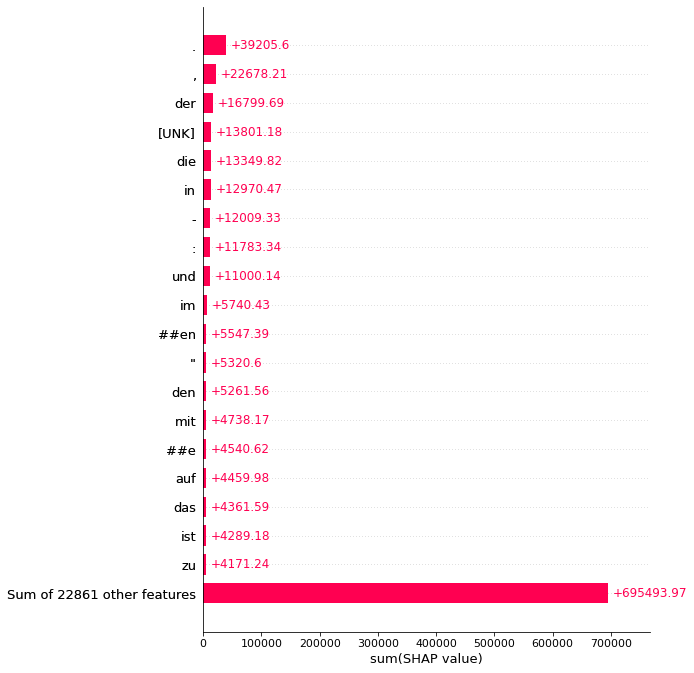

In [309]:
shap.plots.bar(shap_values.abs.sum(0), max_display = 20)

# das hier sind ABSOLUTE Werte, kann also sowohl positiver als auch negativer Einfluss sein
# wegen SUMME wird eigentlich eher Häufigkeit gezeigt

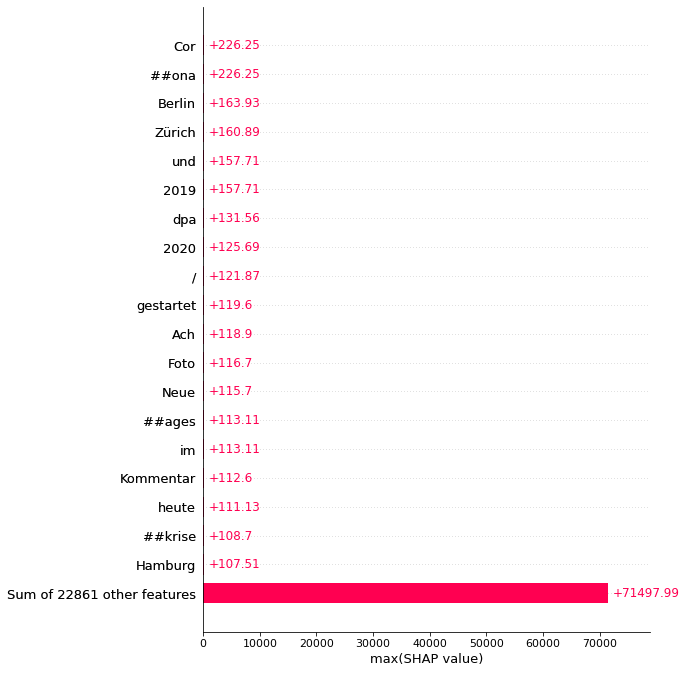

In [310]:
shap.plots.bar(shap_values.abs.max(0), max_display=20)

# wegen MAX nicht sehr aussagekräftig
# gut möglich, dass Token nur in einem Dokument (mit hohem Wert) vorkommt...

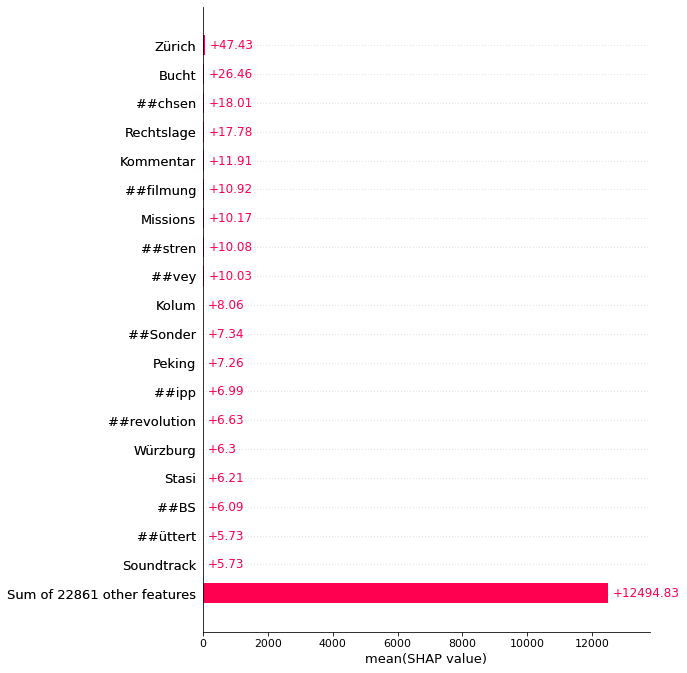

In [311]:
shap.plots.bar(shap_values.abs.mean(0), max_display = 20)

# vermutlich der interessanteste/aussagekräftigste Plot
# trotzdem: wahrscheinlich kommen genannte Tokens nur in wenigen Dokumenten vor

In [1684]:
#shap.plots.bar(shap_values) # der Default ist also .abs.mean(0)

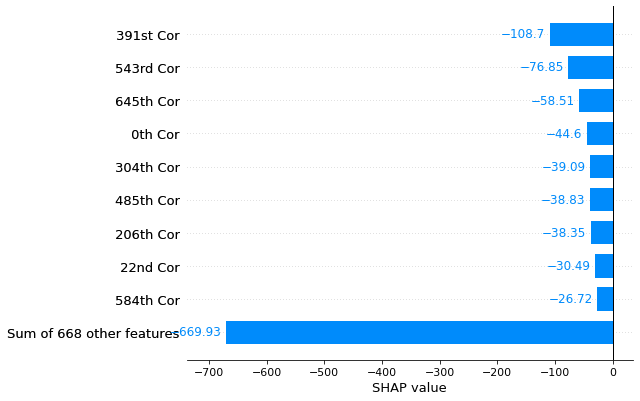

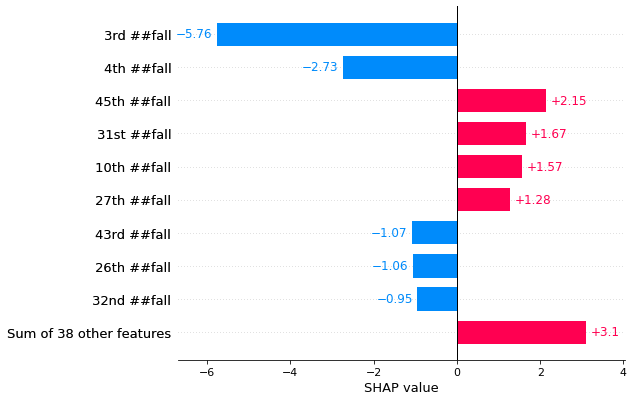

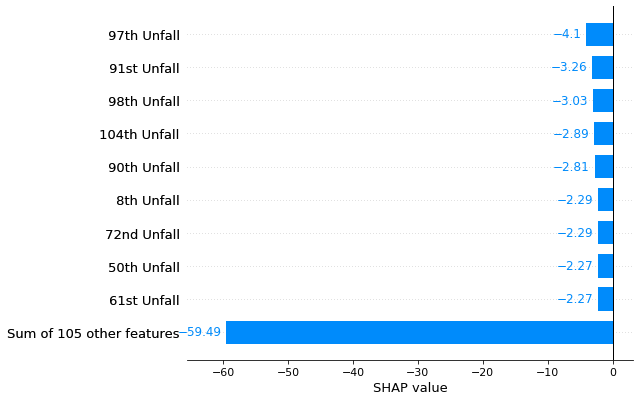

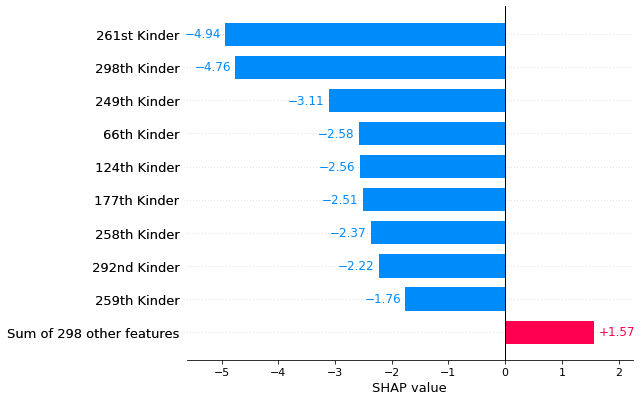

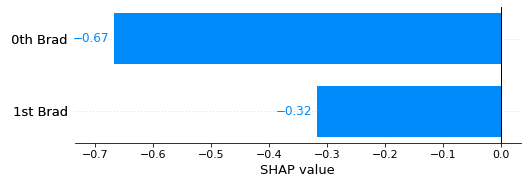

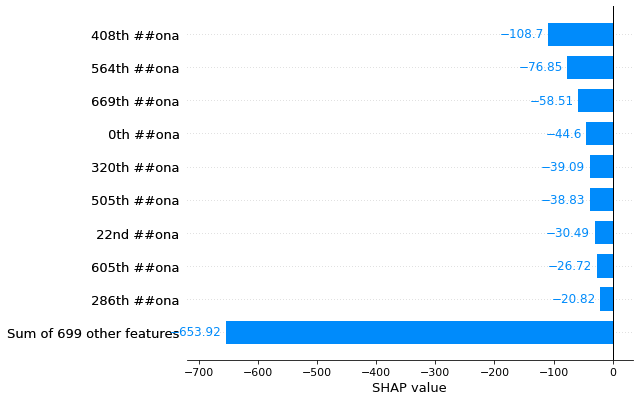

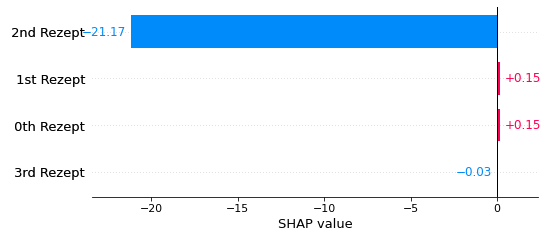

In [88]:
shap.plots.bar(shap_values[:,"Cor"])
shap.plots.bar(shap_values[:,"##fall"])
shap.plots.bar(shap_values[:,"Unfall"])
shap.plots.bar(shap_values[:,"Kinder"])
shap.plots.bar(shap_values[:,"Brad"])
shap.plots.bar(shap_values[:,"##ona"])
shap.plots.bar(shap_values[:,"Rezept"])

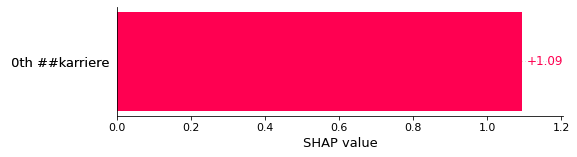

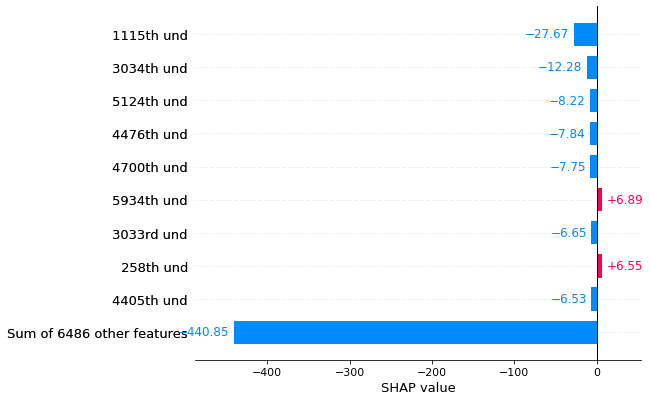

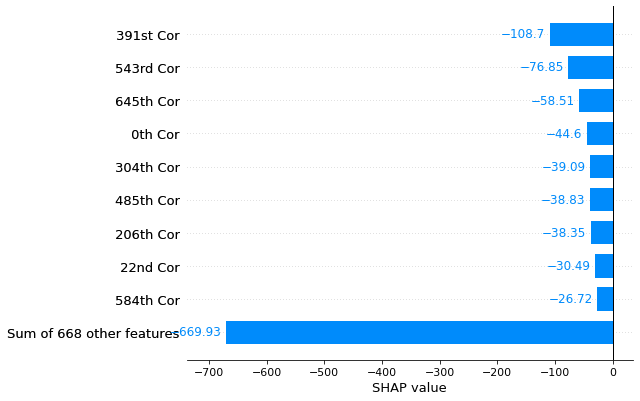

In [89]:
shap.plots.bar(shap_values[:,"##karriere"])
shap.plots.bar(shap_values[:,"und"])
#shap.plots.bar(shap_values[:,"##krise"])
shap.plots.bar(shap_values[:,"Cor"])


In [182]:
shap_values[:,"Cor"] # das sind alle Vorkommen von "Geld", man sieht die Werte

.values =
[-44.59903337717409, -1.6450363117572717, -0.009305442263824692, -0.6361752065913376, -0.3582922842684863, -0.20631716450925255, -1.1139203803387896, -0.8339690149750212, -0.4210913018686906, -0.3667103958974598, -0.5863031074022277, 0.3678960699730953, 0.11514766506786052, 0.05299485809095089, 0.10610679389282263, -0.2821401837628493, 0.14393916027915601, -13.688065139893055, -0.6508321870819526, -0.833387790087395, -0.24095006099348834, 0.41094987115851733, -30.489326033191393, -0.04111040898388453, -0.24983548528706825, 0.04934148376697589, -0.8622452437234315, -0.9889594431993469, -3.4670847257695145, -0.3883170091870467, 0.028932394846314578, -3.056433864301704, -3.5744290440401123, -0.07608880368269827, -0.6772610578594375, -0.5255641757756409, -1.7634890952883118, -1.7571616946224509, -12.038123398799437, -1.3944649583692303, 0.599942004089877, -0.04112976908279664, -0.06427022360349113, -0.004736531654794683, -0.004736531654794682, -0.04388300397876622, 0.073118891518

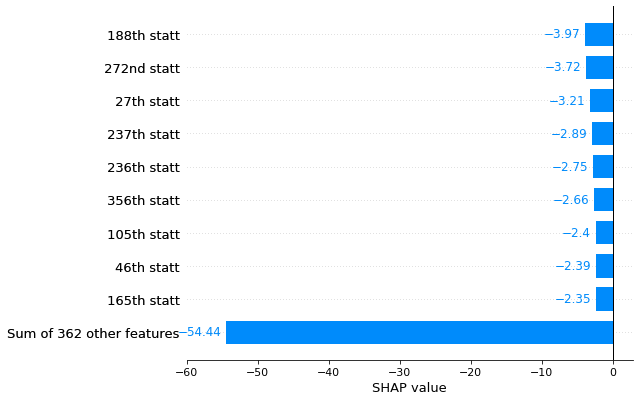

In [312]:
shap.plots.bar(shap_values[:,"statt"])
# anscheinend beziehen sich die Zahlen tatsächlich auf das n-te Vorkommen im explain-Set#
# "8th" heißt aber nicht shap_value[8], sondern "das 8. Vorkommen"... ist also nicht auffindbar

In [313]:
print(len(shap_values[:, "statt "]))
print(len(shap_values[:, "statt"]))

0
371


# Versuch: selbst mit den shap_values weiterarbeiten...

Was hier passiert: Es werden alle features (Tokens) im dev-Set gesammelt und gezählt, diejenigen, die öfter als N mal vorkommen, werden beobachtet. Daraus wird dann ein DF angelegt, der neben dem Count (Auftreten) den mean und min und max und std berechnet. Dann kann man sehen, welche (einigermaßen) häufgen Wörter eine wie große Auswirkung (mean shap value) haben.

In [314]:
len(shap_values.feature_names) # das ist jeder Text einzeln

3638

In [315]:
len(shap_values[0].feature_names) # das sind die Tokens eines Textes

514

In [316]:
len(shap_values[6].feature_names) # das sind die Tokens eines Textes

354

In [317]:
from collections import defaultdict
features_dict = defaultdict(int)

In [318]:
# get a set of ALL tokens (types...) with their counts in the 1000 documents
# goal: just interested in tokens that are frequent
for nr_doc, doc in enumerate(shap_values):
    print(nr_doc, end='\r')
    for token in doc.feature_names:
        features_dict[token] +=1

In [319]:
len(features_dict) # insgesamt kommen in den 1000 Dokumenten 19568 verschiedene Tokens vor

22880

In [218]:
features_dict

defaultdict(int,
            {'[CLS]': 1000,
             'Initiative': 32,
             '"': 3571,
             'Grün': 30,
             'statt': 100,
             'Grau': 7,
             'üb': 8,
             '##t': 1186,
             'Kritik': 45,
             ':': 3309,
             'Das': 982,
             'grüne': 14,
             'Gewerbegebiet': 16,
             'in': 5620,
             'Mel': 215,
             '##le': 191,
             'ist': 2199,
             'nicht': 1749,
             'grün': 11,
             'genug': 28,
             '.': 18837,
             'Nachhalt': 11,
             '##ig': 224,
             ',': 14514,
             'ök': 15,
             '##ologisch': 7,
             'zu': 2469,
             '##kunfts': 2,
             '##fähig': 9,
             'So': 260,
             'soll': 353,
             'das': 2538,
             '18': 100,
             'Hektar': 27,
             'große': 101,
             'zwischen': 222,
             'Ges': 30,
             

In [320]:
features_dict["Kommentar"]

67

In [321]:
# select only tokens that appear >=n times in the 1000 docs
frequent_tokens = [k for k,v in features_dict.items() if v >= 100]

In [322]:
frequent_tokens[:10]

['[CLS]', '"', 'Grün', 'statt', '##t', 'Kritik', ':', 'Das', 'in', 'Mel']

In [323]:
len(frequent_tokens)

2135

In [364]:
df_shap = pd.DataFrame(index=frequent_tokens, columns = ["count", "mean", "mean_abs", "min", "max", "std"])

In [365]:
df_shap.shape

(2135, 6)

In [366]:
print(features_dict["statt"]) # "statt" kommt 100mal vor
print(features_dict["Kommentar"])
print(features_dict["und"])
print(features_dict["Zürich"])

371
67
23796
5


In [367]:
df_shap.head(10)

,count,mean,mean_abs,min,max,std
[CLS],NaN,NaN,NaN,NaN,NaN,NaN
"""",NaN,NaN,NaN,NaN,NaN,NaN
Grün,NaN,NaN,NaN,NaN,NaN,NaN
statt,NaN,NaN,NaN,NaN,NaN,NaN
##t,NaN,NaN,NaN,NaN,NaN,NaN
Kritik,NaN,NaN,NaN,NaN,NaN,NaN
:,NaN,NaN,NaN,NaN,NaN,NaN
Das,NaN,NaN,NaN,NaN,NaN,NaN
in,NaN,NaN,NaN,NaN,NaN,NaN
Mel,NaN,NaN,NaN,NaN,NaN,NaN


In [368]:
shap_values[:, "Kommentar"].values

[-33.08303015842154,
 -19.385001872967255,
 -1.3941700264701709,
 -1.1392115436188834,
 -27.189210581311993,
 -1.6706588869830312,
 -1.7575476677170399,
 -7.369373103151277,
 -3.9021587384243315,
 -112.60343500508898,
 -6.376119058268595,
 -4.893107454358626,
 -4.366825927240215,
 -12.124692396989934,
 -3.797012409605077,
 -1.1741656000700949,
 -0.7161844584933091,
 -4.142790798633451,
 -10.999797707658738,
 -6.005582394950099,
 -13.035130787456826,
 -1.0468260967462575,
 -43.85532375998688,
 -0.9836835359952585,
 -6.954647649819723,
 -42.200420993467105,
 -8.95072683644837,
 -2.711241318721319,
 -0.6912704584645575,
 -39.314716308173516,
 -4.28935857430235,
 -42.29235230657949,
 -5.0428201265267285,
 -4.708434792633683,
 -1.8541345312933117,
 -2.489545425970558,
 -2.8329392679377112,
 -39.44527465356735,
 -2.1897287950941213,
 -7.926067947219374,
 -2.7844466349937647,
 -60.54430407315091,
 -2.4672964685906402,
 -4.104236899467268,
 -4.2363867211489845,
 -7.459751037701899,
 -14.774664

In [377]:
l = [-4,3,4,2,7,9,-2]
print(np.array(l))
print(abs(np.array(l)))


print(np.mean(l))
print(np.mean(abs(np.array(l))))

[-4  3  4  2  7  9 -2]
[4 3 4 2 7 9 2]
2.7142857142857144
4.428571428571429


In [378]:
# getting mean shap_value and count of the frequent tokens
for nr_feature, feature in enumerate(frequent_tokens):
    print(nr_feature, feature, end="\r")
    values = shap_values[:, feature].values
    count = len(values)
    mean = np.mean(values)
    mean_abs = np.mean(abs(np.array(values)))
    min_value = np.min(values)
    max_value = np.max(values)
    std = np.std(values)
    df_shap.loc[feature]["mean"] = mean
    df_shap.loc[feature]["mean_abs"] = mean_abs
    df_shap.loc[feature]["count"] = count
    df_shap.loc[feature]["min"] = min_value
    df_shap.loc[feature]["max"] = max_value
    df_shap.loc[feature]["std"] = std



In [379]:
df_shap.head()

,count,mean,mean_abs,min,max,std
[CLS],3638,0.268328,0.427101,-16.757,10.2064,0.796501
"""",12040,-0.155974,0.44191,-36.2942,14.5278,0.993608
Grün,118,-0.337759,0.660723,-18.721,1.19552,1.83855
statt,371,-0.217735,0.51824,-3.96745,2.00384,0.778072
##t,4253,-0.196376,0.592205,-28.155,7.72273,1.05605


In [380]:
df_shap["abs"] = abs(df_shap["mean"])

In [381]:
df_shap_PATH = utils.OUTPUT / 'shap_values' / f'{identifier}_TO{TO}_df_shap.tsv'

In [382]:
df_shap.to_csv(df_shap_PATH, sep = "\t")

In [383]:
df_shap = pd.read_csv(df_shap_PATH, sep = "\t", index_col = 0)

In [384]:
df_shap.describe()

,count,mean,mean_abs,min,max,std,abs
count,2135.000000,2135.000000,2135.000000,2135.000000,2135.000000,2135.000000,2135.000000
mean,550.472131,-0.224689,0.572417,-9.880532,3.020004,1.082469,0.237852
std,2470.846975,0.261176,0.221844,15.489851,3.746814,0.911092,0.249242
min,100.000000,-4.176541,0.283247,-226.246106,0.532088,0.373089,0.000166
25%,125.000000,-0.292735,0.456767,-9.646497,1.560194,0.720944,0.090865
50%,182.000000,-0.177247,0.521567,-5.727263,2.211172,0.872672,0.179687
75%,321.000000,-0.082310,0.620965,-3.631767,3.310542,1.131723,0.293930
max,68520.000000,0.473704,4.494735,-0.927451,88.699220,13.894338,4.176541


In [385]:
#df_shap.sort_values("abs", ascending = False).head(20)
df_shap.sort_values("mean_abs", ascending = False).head(20)



#df_shap.sort_values("mean", ascending = False).head(20)
#df_shap.sort_values("mean", ascending = True).head(20)

#df_shap.sort_values("count", ascending = False).head(20)

,count,mean,mean_abs,min,max,std,abs
Berlin,397,-4.176541,4.494735,-163.927969,4.238321,13.165027,4.176541
dpa,158,-3.160942,3.458765,-131.561470,5.309466,13.894338,3.160942
Hamburg,144,-2.620866,3.052740,-107.507530,3.655670,11.873210,2.620866
##kap,129,-1.987710,2.117262,-14.527868,1.502786,2.937356,1.987710
2019,568,-1.830779,2.064225,-157.712526,6.149412,11.180037,1.830779
Heute,110,-1.240619,1.855261,-46.193055,3.045035,5.797785,1.240619
2020,714,-1.490656,1.680059,-125.688892,3.340485,8.350772,1.490656
Münster,178,-1.292093,1.635885,-67.698841,2.155914,5.656614,1.292093
Amtsgericht,106,-1.333802,1.622903,-26.778299,3.658125,3.184778,1.333802
Neue,155,-1.166359,1.564533,-115.698369,3.650343,9.309659,1.166359


In [386]:
df_shap[df_shap["count"] >= 200].sort_values("mean_abs", ascending = False).head(20)

,count,mean,mean_abs,min,max,std,abs
Berlin,397,-4.176541,4.494735,-163.927969,4.238321,13.165027,4.176541
2019,568,-1.830779,2.064225,-157.712526,6.149412,11.180037,1.830779
2020,714,-1.490656,1.680059,-125.688892,3.340485,8.350772,1.490656
Foto,908,-1.214961,1.497722,-116.702902,6.654218,7.435539,1.214961
Cor,2570,-1.279466,1.392296,-226.246106,19.538032,6.161728,1.279466
##bergen,255,-1.259714,1.384052,-20.801883,1.783234,1.990872,1.259714
Osnabrück,2989,-1.147394,1.371961,-94.502387,3.882214,4.083135,1.147394
2018,271,-1.138202,1.367497,-98.618441,2.331326,7.021558,1.138202
##ona,2625,-1.231468,1.348499,-226.246106,19.538032,6.037401,1.231468
Neuen,222,-1.210942,1.345750,-15.817370,1.084952,2.291141,1.210942


In [390]:
df_shap.loc["Cor"]
df_shap.loc["Berlin"]

count       397.000000
mean         -4.176541
mean_abs      4.494735
min        -163.927969
max           4.238321
std          13.165027
abs           4.176541
Name: Berlin, dtype: float64

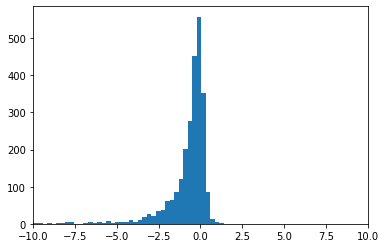

In [388]:
# für ein bestimmtes Feature, alle shap_values
plt.hist(shap_values[:, "Cor"].values, 908)
plt.xlim(-10,10)
plt.show()

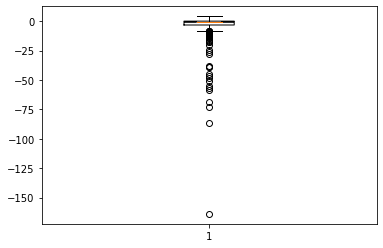

In [361]:
plt.boxplot(shap_values[:, "Berlin"].values, 908)
plt.show()

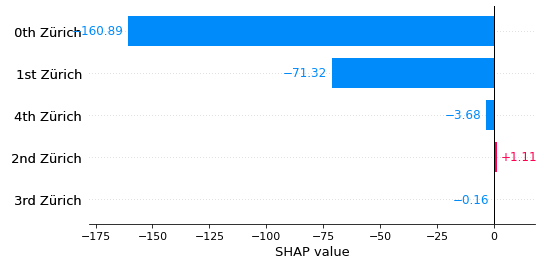

In [344]:
shap.plots.bar(shap_values[:,"Zürich"])

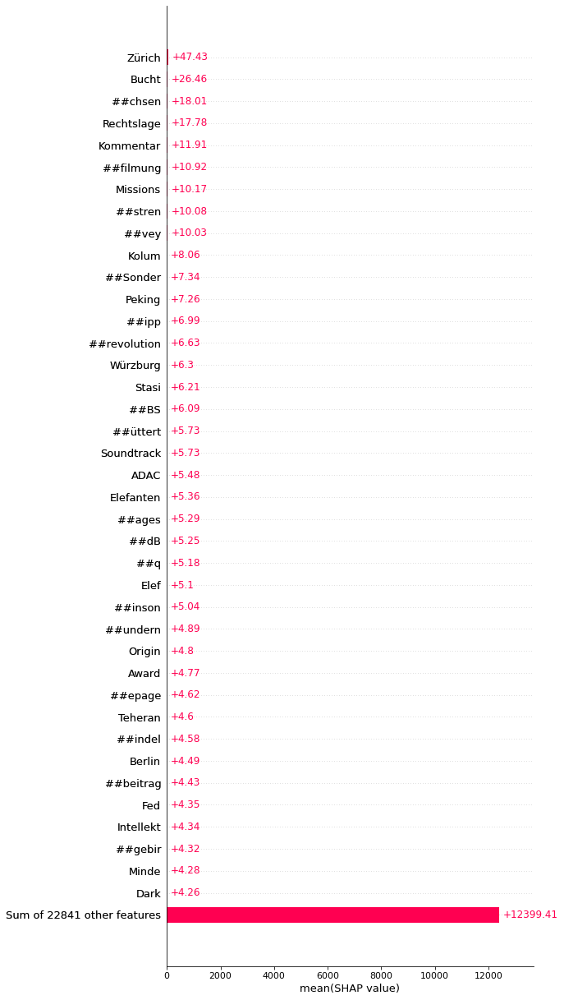

In [389]:
# zum Vergleich: hier kommen halt auch die extrem seltenen Wörter vor
shap.plots.bar(shap_values.abs.mean(0), max_display = 40)

## die andere Plots funktionieren wohl mit dieser Art Daten/Modell/Explainer nicht

In [218]:
shap.summary_plot(shap_values)

AttributeError: 'Explanation' object has no attribute 'base_value'

In [219]:
shap.plots.scatter(shap_values[:,"viele"])

AttributeError: 'list' object has no attribute 'reshape'

In [220]:
shap.plots.waterfall(shap_values[0])

Exception: waterfall_plot requires a scalar base_values of the model output as the first parameter, but you have passed an array as the first parameter! Try shap.waterfall_plot(explainer.base_values[0], values[0], X[0]) or for multi-output models try shap.waterfall_plot(explainer.base_values[0], values[0][0], X[0]).

In [221]:
shap.plots.beeswarm(shap_values)

ValueError: operands could not be broadcast together with shapes (514,) (332,) 

In [222]:
shap.plots.heatmap(shap_values)

ValueError: operands could not be broadcast together with shapes (514,) (332,) 

In [223]:
for att in dir(shap_values):
    print(att)#, getattr(shap_values,att))

__class__
__copy__
__delattr__
__dict__
__dir__
__doc__
__eq__
__format__
__ge__
__getattribute__
__getitem__
__gt__
__hash__
__init__
__init_subclass__
__le__
__len__
__lt__
__module__
__ne__
__new__
__reduce__
__reduce_ex__
__repr__
__setattr__
__sizeof__
__slotnames__
__str__
__subclasshook__
__weakref__
_flatten_feature_names
_numpy_func
_s
_use_data_as_feature_names
abs
argsort
base_values
clustering
data
display_data
feature_names
flip
hclust
hierarchical_values
instance_names
lower_bounds
main_effects
max
mean
min
output_indexes
output_names
percentile
sample
shape
sum
transform_history
upper_bounds
values


In [345]:
shap_values.base_values # hä? Warum ist der 385? das ist nicht der Mittelwert der predictions!

array([[237.12289429],
       [237.12289429],
       [237.12289429],
       ...,
       [237.12289429],
       [261.4107666 ],
       [237.12289429]])

In [225]:
shap_values.feature_names

[['[CLS]',
  'Initiative',
  '"',
  'Grün',
  'statt',
  'Grau',
  '"',
  'üb',
  '##t',
  'Kritik',
  ':',
  'Das',
  'grüne',
  'Gewerbegebiet',
  'in',
  'Mel',
  '##le',
  'ist',
  '"',
  'nicht',
  'grün',
  'genug',
  '"',
  'Mel',
  '##le',
  '.',
  'Nachhalt',
  '##ig',
  ',',
  'ök',
  '##ologisch',
  ',',
  'zu',
  '##kunfts',
  '##fähig',
  ':',
  'So',
  'soll',
  'das',
  '18',
  'Hektar',
  'große',
  'Gewerbegebiet',
  'in',
  'Mel',
  '##le',
  'zwischen',
  'Ges',
  '##mol',
  '##der',
  'Straße',
  ',',
  'Am',
  'Fu',
  '##hlen',
  '##kamp',
  ',',
  'Kirch',
  '##bre',
  '##ede',
  '##weg',
  'und',
  'der',
  'A',
  '##30',
  'nach',
  'dem',
  'Willen',
  'der',
  'Stadt',
  'und',
  'der',
  'Bürger',
  '##initiative',
  '"',
  'Grün',
  'statt',
  'Grau',
  '"',
  'konzipiert',
  'werden',
  '.',
  'Die',
  'bisherigen',
  'Bemühungen',
  'der',
  'Kommune',
  'gehen',
  'der',
  'Initiative',
  'allerdings',
  'nicht',
  'weit',
  'genug',
  '.',
  'Sie',
  've

In [83]:
shap_values[37].feature_names

['[CLS]',
 'Mord',
 'im',
 'Borde',
 '##ll',
 ':',
 'Osnabrück',
 ':',
 'Angeklagte',
 '##r',
 'im',
 'Mord',
 '##fall',
 'Lil',
 '##ly',
 'sagt',
 'aus',
 'Osnabrück',
 '.',
 'Er',
 'sieht',
 'nicht',
 'aus',
 ',',
 'wie',
 'ein',
 'Mörder',
 '.',
 'Aber',
 'wem',
 'sieht',
 'man',
 'seine',
 'Taten',
 'schon',
 'an',
 '?',
 'Am',
 'zweiten',
 'Prozess',
 '##tag',
 'im',
 'sogenannten',
 '[UNK]',
 'Mord',
 '##fall',
 'Lil',
 '##ly',
 '[UNK]',
 'erscheint',
 'der',
 '23',
 'Jahre',
 'alte',
 'Angeklagte',
 'glatt',
 'ras',
 '##iert',
 'vor',
 'der',
 'Schw',
 '##urger',
 '##ichts',
 '##kammer',
 '.',
 'Der',
 'dunkle',
 'Bart',
 'ist',
 'weg',
 '.',
 'So',
 'offen',
 'wie',
 'jetzt',
 'sein',
 'Gesicht',
 'wirkt',
 ',',
 'so',
 'offen',
 'berichtet',
 'der',
 'Mann',
 'aus',
 'seinem',
 'Lebens',
 '##lauf',
 'und',
 'von',
 'jenem',
 'folgen',
 '##schwer',
 '##en',
 'Tag',
 'am',
 '2',
 '.',
 'Juli',
 'diesen',
 'Jahres',
 '.',
 'Die',
 'Staatsanwalt',
 '##schaft',
 'wirft',
 'ihm',
 '

In [226]:
print(len(shap_values[0].values))
print(len(shap_values[0].feature_names))
print(len(set((shap_values[0].feature_names))))

print("----")

print(len(shap_values[1].values))
print(len(shap_values[1].feature_names))
print(len(set((shap_values[1].feature_names))))

print("----")
for i in range(len(shap_values)):
    print(i, len(shap_values[i].feature_names), len(set((shap_values[i].feature_names))))



# die sind nicht alle gleich lang (hängt davon ab, welche Tokens im Text vorkommen...)
# Daher funktionieren die Plots oben auch nicht, oder?


514
514
279
----
514
514
261
----
0 514 279
1 514 261
2 514 257
3 332 206
4 407 238
5 514 305
6 354 238
7 514 308
8 514 287
9 514 312
10 514 281
11 514 318
12 514 302
13 388 242
14 514 258
15 413 261
16 514 262
17 514 301
18 514 303
19 249 177
20 258 174
21 514 329
22 514 273
23 514 270
24 514 302
25 514 308
26 514 239
27 514 300
28 514 300
29 197 133
30 406 221
31 471 268
32 401 224
33 276 173
34 514 271
35 514 224
36 263 175
37 514 278
38 288 193
39 242 146


KeyboardInterrupt: 

In [1708]:
#shap_values[166]

In [1715]:
dev_preds.iloc[130].article_text[:800]

'„Tatort“ heute aus München: Verriss von früher: „Tatort: Wenn Frauen Austern essen“ in der Kritik Berlin. Ab heute zeigt die ARD zehn Wochen lang alte Sonntagskrimis. Lesen Sie noch einmal unsere Kritik zum „Tatort: Wenn Frauen Austern essen“. Der „Tatort“ ist in der Sommerpause. Zehn Wochen lang laufen keine neuen Folgen. Und welche Wiederholung gezeigt wird, entscheiden diesmal die Zuschauer. Zum 50. Jahrestag der Reihe stehen beim „Tatort“-Voting 50 Sonntagskrimis der letzten 20 Jahre zur Wahl. Zum Auftakt lösen am Sonntag, 21. Juni, die Münchner Kommissare Batic und Leitmayr den Fall „Wenn Frauen Austern essen“. Mehr TV So knapp schlugen Leitmayr und Batic den „Tatort“ aus Münster  Wie funktioniert das „Tatort“-Voting? Alle Details  365 Days: Polnischer Softporno blamiert Netflix Worum'

In [1716]:
dev_preds.iloc[130].truncated_128[:800]

'[UNK] Tatort [UNK] heute aus München : Verriss von früher : [UNK] Tatort : Wenn Frauen Austern essen [UNK] in der Kritik Berlin . Ab heute zeigt die ARD zehn Wochen lang alte Sonntagskrimis . Lesen Sie noch einmal unsere Kritik zum [UNK] Tatort : Wenn Frauen Austern essen [UNK] . Der [UNK] Tatort [UNK] ist in der Sommerpause . Zehn Wochen lang laufen keine neuen Folgen . Und welche Wiederholung gezeigt wird , entscheiden diesmal die Zuschauer . Zum 50 . Jahrestag der Reihe stehen beim [UNK] Tatort [UNK] - Voting 50 Sonntagskrimis der letzten 20 Jahre zur Wahl . Zum Auftakt lösen am Sonntag , 21 . Juni , die Münchner Kommissare Bat'

In [1717]:
tokenizer(dev_preds.iloc[130].truncated_128)

{'input_ids': [3, 2, 14603, 2, 1138, 147, 1517, 26964, 133, 8246, 88, 1869, 26964, 2, 14603, 26964, 2111, 1895, 2808, 212, 17853, 2, 50, 21, 4312, 715, 26914, 226, 1138, 2452, 30, 9986, 1969, 2124, 1489, 3421, 7148, 26917, 3565, 82, 26914, 20251, 371, 357, 1757, 6712, 4312, 260, 2, 14603, 26964, 2111, 1895, 2808, 212, 17853, 2, 26914, 233, 2, 14603, 2, 127, 50, 21, 2213, 13034, 26914, 7343, 2124, 1489, 7746, 668, 1280, 2543, 26914, 1356, 1999, 19880, 5809, 292, 26918, 2997, 8977, 30, 6160, 26914, 2147, 2186, 26914, 20993, 21, 4046, 1632, 785, 2, 14603, 2, 26935, 4087, 11911, 26908, 2186, 7148, 26917, 3565, 82, 21, 1825, 148, 573, 252, 1401, 26914, 2147, 14619, 11948, 235, 3030, 26918, 2439, 26914, 1140, 26918, 30, 4596, 19198, 26897, 7348, 4], 'token_type_ids': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [1718]:
tokenizer(dev_preds.iloc[130].article_text[:700]) # auch hier in UNK, also kann/muss ich es nicht ändern

{'input_ids': [3, 2, 14603, 2, 1138, 147, 1517, 26964, 133, 8246, 88, 1869, 26964, 2, 14603, 26964, 2111, 1895, 2808, 212, 17853, 2, 50, 21, 4312, 715, 26914, 226, 1138, 2452, 30, 9986, 1969, 2124, 1489, 3421, 7148, 26917, 3565, 82, 26914, 20251, 371, 357, 1757, 6712, 4312, 260, 2, 14603, 26964, 2111, 1895, 2808, 212, 17853, 2, 26914, 233, 2, 14603, 2, 127, 50, 21, 2213, 13034, 26914, 7343, 2124, 1489, 7746, 668, 1280, 2543, 26914, 1356, 1999, 19880, 5809, 292, 26918, 2997, 8977, 30, 6160, 26914, 2147, 2186, 26914, 20993, 21, 4046, 1632, 785, 2, 14603, 2, 26935, 4087, 11911, 26908, 2186, 7148, 26917, 3565, 82, 21, 1825, 148, 573, 252, 1401, 26914, 2147, 14619, 11948, 235, 3030, 26918, 2439, 26914, 1140, 26918, 30, 4596, 19198, 26897, 7348, 434, 42, 5481, 18753, 26900, 86, 1000, 2, 2111, 1895, 2808, 212, 17853, 2, 26914, 1972, 4332, 507, 3349, 25673, 5481, 18753, 26900, 42, 7348, 434, 86, 2, 14603, 2, 147, 6717, 1316, 69, 4], 'token_type_ids': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [227]:
print(len(explainer(["", "hallo hier steht was"])[0].feature_names))
print(len(explainer(["", "hallo hier steht was"])[1].feature_names))

2
7


In [228]:
print(explainer([""]).base_values)
print(explainer(["hallo hier steht was"]).base_values)
print(explainer(["sdhsjhdjahsd"]).base_values)

[[634.64056396]]
[[372.80615234]]
[[371.24075317]]


In [229]:
tokenizer.vocab_size

30000

In [230]:
TOKENIZER.vocab_size

30000